## Project team's ID : PTID-CDS-FEB-24-1834

## Client: No-Churn Telecom
## Category: Telecom – Churn Rate ML

## Importing the Basic Libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
from scipy import stats

In [2]:
#pip install mysql-connector-python

In [3]:
#Connecting with SQL Database 
import mysql.connector

# making connections
connection=mysql.connector.connect(host = '18.136.157.135',
                                  user='dm_team3',
                                  password='DM!$!Team!27@9!20&')
print(connection)

In [4]:
# getting the database name
cursor=connection.cursor()
cursor.execute('show databases')
for i in cursor:
    print(i)

('information_schema',)
('project_telecom',)


In [5]:
# connecting the database
connection=mysql.connector.connect(host='18.136.157.135',
                                  user='dm_team3',
                                  password='DM!$!Team!27@9!20&',
                                  database='project_telecom')

In [6]:
db_tables=pd.read_sql_query('show tables',connection)
print(db_tables)

  Tables_in_project_telecom
0        telecom_churn_data


In [7]:
query="select * from telecom_churn_data"

In [8]:
data=pd.read_sql(query,connection)
data

,columns1,columns2,columns3,columns4,columns5,columns6,columns7,columns8,columns9,columns10,...,columns12,columns13,columns14,columns15,columns16,columns17,columns18,columns19,columns20,columns21
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10,3,2.7,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.7,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.3,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.9,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,NY,57,510,345-7512,no,yes,25,144,81,24.48,...,112,15.91,158.6,122,7.14,8.5,6,2.3,3,False.
4613,NM,177,408,343-6820,no,yes,29,189,91,32.13,...,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False.
4614,VT,67,408,338-4794,no,yes,33,127.5,126,21.68,...,129,25.17,200.9,91,9.04,13,3,3.51,1,False.
4615,MI,98,415,355-8388,no,yes,23,168.9,98,28.71,...,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False.


In [9]:
data.columns

Index(['columns1', 'columns2', 'columns3', 'columns4', 'columns5', 'columns6',
       'columns7', 'columns8', 'columns9', 'columns10', 'columns11',
       'columns12', 'columns13', 'columns14', 'columns15', 'columns16',
       'columns17', 'columns18', 'columns19', 'columns20', 'columns21'],
      dtype='object')

In [10]:
data.rename(columns={
    'columns1': 'State',
    'columns2': 'Account Length',
    'columns3': 'Area Code',
    'columns4': 'Phone',
    'columns5': 'International Plan',
    'columns6': 'VMail Plan',
    'columns7': 'VMail Message',
    'columns8': 'Day Mins',
    'columns9': 'Day Calls',
    'columns10': 'Day Charge',
    'columns11': 'Eve Mins',
    'columns12': 'Eve Calls',
    'columns13': 'Eve Charge',
    'columns14': 'Night Mins',
    'columns15': 'Night Calls',
    'columns16': 'Night Charge',
    'columns17': 'International Mins',
    'columns18': 'International calls',
    'columns19': 'International Charge',
    'columns20': 'CustServ Calls',
    'columns21': 'Churn'
}, inplace=True)

In [11]:
data

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,...,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10,3,2.7,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.7,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.3,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.9,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,NY,57,510,345-7512,no,yes,25,144,81,24.48,...,112,15.91,158.6,122,7.14,8.5,6,2.3,3,False.
4613,NM,177,408,343-6820,no,yes,29,189,91,32.13,...,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False.
4614,VT,67,408,338-4794,no,yes,33,127.5,126,21.68,...,129,25.17,200.9,91,9.04,13,3,3.51,1,False.
4615,MI,98,415,355-8388,no,yes,23,168.9,98,28.71,...,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False.


# Note
All the columns have been changed to their respective names given by the respective documentation

# Basic check

In [12]:
data.shape

(4617, 21)

In [13]:
data.columns

Index(['State', 'Account Length', 'Area Code', 'Phone', 'International Plan',
       'VMail Plan', 'VMail Message', 'Day Mins', 'Day Calls', 'Day Charge',
       'Eve Mins', 'Eve Calls', 'Eve Charge', 'Night Mins', 'Night Calls',
       'Night Charge', 'International Mins', 'International calls',
       'International Charge', 'CustServ Calls', 'Churn'],
      dtype='object')

In [14]:
data.describe()

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,...,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
count,4617,4617,4617,4617,4617,4617,4617,4617,4617,4617,...,4617,4617,4617,4617,4617,4617,4617,4617,4617,4617
unique,51,218,3,4617,2,2,47,1901,123,1901,...,125,1621,1813,130,1012,168,21,168,10,2
top,WV,90,415,382-4657,no,no,0,154,102,26.18,...,105,14.25,194.3,105,9.66,9.8,3,2.65,1,False.
freq,149,63,2299,1,4171,3381,3381,10,108,10,...,111,15,10,115,19,81,925,81,1651,3961


In [15]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4617 entries, 0 to 4616
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   State                 4617 non-null   object
 1   Account Length        4617 non-null   object
 2   Area Code             4617 non-null   object
 3   Phone                 4617 non-null   object
 4   International Plan    4617 non-null   object
 5   VMail Plan            4617 non-null   object
 6   VMail Message         4617 non-null   object
 7   Day Mins              4617 non-null   object
 8   Day Calls             4617 non-null   object
 9   Day Charge            4617 non-null   object
 10  Eve Mins              4617 non-null   object
 11  Eve Calls             4617 non-null   object
 12  Eve Charge            4617 non-null   object
 13  Night Mins            4617 non-null   object
 14  Night Calls           4617 non-null   object
 15  Night Charge          4617 non-null   

In [16]:
data.describe(include=['O'])

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,...,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
count,4617,4617,4617,4617,4617,4617,4617,4617,4617,4617,...,4617,4617,4617,4617,4617,4617,4617,4617,4617,4617
unique,51,218,3,4617,2,2,47,1901,123,1901,...,125,1621,1813,130,1012,168,21,168,10,2
top,WV,90,415,382-4657,no,no,0,154,102,26.18,...,105,14.25,194.3,105,9.66,9.8,3,2.65,1,False.
freq,149,63,2299,1,4171,3381,3381,10,108,10,...,111,15,10,115,19,81,925,81,1651,3961


In [17]:
data.isnull().sum()

State                   0
Account Length          0
Area Code               0
Phone                   0
International Plan      0
VMail Plan              0
VMail Message           0
Day Mins                0
Day Calls               0
Day Charge              0
Eve Mins                0
Eve Calls               0
Eve Charge              0
Night Mins              0
Night Calls             0
Night Charge            0
International Mins      0
International calls     0
International Charge    0
CustServ Calls          0
Churn                   0
dtype: int64

## Note
* all the variables present inside the dataset are in the data type of object
* there is no null values present inside the dataset

# Exploratory Data Analysis

## Univariate Analysis

In [18]:
#!pip install sweetviz

In [19]:
'''import sweetviz as sv 
my_report = sv.analyze(data)
my_report.show_html()'''

'import sweetviz as sv \nmy_report = sv.analyze(data)\nmy_report.show_html()'

## Note
* State - there are 51 distinct states & every state contributing 2-3% do the total data
* Accounting Length - it has 218 distinct numbers repeating the data
* Area Code - it has 3 distinct areas, 415 code is 50%, double the other 408 & 510 code giving 25%
* Phone - every rows has different phone number thus representing unique indivuals
* International Plans - this tells about people having international plans or not, 90% people dont have any international plan
* VMail Plans - 73% of the people do not have the plan
* Day Mins - gives the no. of minutes a person spends in a call, which has a distinct values of 1901
* Day Calls - No. of calls per day, which has distinct values of 123
* Day charge - charges per day, has 1901 distinct numbers
* Eve Mins - evening minutes represents minutes spent on call during evenings
* Eve Calls - No. of calls done in evening, 125 distinct calls durations
* Eve Charge - charges added to the calls during evening, 1621 distinct values
* Night Mins - call minutes at night, 1831 distinct values
* Night Calls - No. of calls during night, 130 distinct values
* Night Charge - charges added during night calls, 1021 distinct charges
* International Mins - international call minutes, 168 distinct minutes
* International Calls - no. of international calls, 21 distinct calls
* International Charge - charges added to international calls
* CustServ Calls - no. of times a person has called for customer service, 10 distinct values
* Churn - No. of people moving to rival telecom, 14% people moving

# Bivariate Analysis

## Checking the relation of the all the variable with respect to the target variable - Churn

In [20]:
data

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,...,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10,3,2.7,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.7,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.3,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.9,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,NY,57,510,345-7512,no,yes,25,144,81,24.48,...,112,15.91,158.6,122,7.14,8.5,6,2.3,3,False.
4613,NM,177,408,343-6820,no,yes,29,189,91,32.13,...,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False.
4614,VT,67,408,338-4794,no,yes,33,127.5,126,21.68,...,129,25.17,200.9,91,9.04,13,3,3.51,1,False.
4615,MI,98,415,355-8388,no,yes,23,168.9,98,28.71,...,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False.


In [21]:
data.shape

(4617, 21)

In [22]:
data.State.unique()

array(['KS', 'OH', 'NJ', 'OK', 'AL', 'MA', 'MO', 'LA', 'WV', 'IN', 'RI',
       'IA', 'MT', 'NY', 'ID', 'VT', 'VA', 'TX', 'FL', 'CO', 'AZ', 'SC',
       'NE', 'WY', 'HI', 'IL', 'NH', 'GA', 'AK', 'MD', 'AR', 'WI', 'OR',
       'MI', 'DE', 'UT', 'CA', 'MN', 'SD', 'NC', 'WA', 'NM', 'NV', 'DC',
       'KY', 'ME', 'MS', 'TN', 'PA', 'CT', 'ND'], dtype=object)

In [23]:
data.columns

Index(['State', 'Account Length', 'Area Code', 'Phone', 'International Plan',
       'VMail Plan', 'VMail Message', 'Day Mins', 'Day Calls', 'Day Charge',
       'Eve Mins', 'Eve Calls', 'Eve Charge', 'Night Mins', 'Night Calls',
       'Night Charge', 'International Mins', 'International calls',
       'International Charge', 'CustServ Calls', 'Churn'],
      dtype='object')

In [24]:
data.head(3)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,...,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10,3,2.7,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.7,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.3,162.6,104,7.32,12.2,5,3.29,0,False.


In [25]:
# List of columns to convert to integer data type
columns_to_convert = [
    'Account Length', 'Area Code', 'Phone', 
       'VMail Message', 'Day Mins', 'Day Calls', 'Day Charge',
       'Eve Mins', 'Eve Calls', 'Eve Charge', 'Night Mins', 'Night Calls',
       'Night Charge', 'International Mins', 'International calls',
       'International Charge', 'CustServ Calls'
]

# Convert each column to integer data type
for column in columns_to_convert:
    # Handle non-convertible values and missing values
    data[column] = pd.to_numeric(data[column], errors='coerce').fillna(0).astype(int)

# Print the data types of the columns after conversion
print(data.dtypes)


State                   object
Account Length           int32
Area Code                int32
Phone                    int32
International Plan      object
VMail Plan              object
VMail Message            int32
Day Mins                 int32
Day Calls                int32
Day Charge               int32
Eve Mins                 int32
Eve Calls                int32
Eve Charge               int32
Night Mins               int32
Night Calls              int32
Night Charge             int32
International Mins       int32
International calls      int32
International Charge     int32
CustServ Calls           int32
Churn                   object
dtype: object


In [26]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4617 entries, 0 to 4616
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   State                 4617 non-null   object
 1   Account Length        4617 non-null   int32 
 2   Area Code             4617 non-null   int32 
 3   Phone                 4617 non-null   int32 
 4   International Plan    4617 non-null   object
 5   VMail Plan            4617 non-null   object
 6   VMail Message         4617 non-null   int32 
 7   Day Mins              4617 non-null   int32 
 8   Day Calls             4617 non-null   int32 
 9   Day Charge            4617 non-null   int32 
 10  Eve Mins              4617 non-null   int32 
 11  Eve Calls             4617 non-null   int32 
 12  Eve Charge            4617 non-null   int32 
 13  Night Mins            4617 non-null   int32 
 14  Night Calls           4617 non-null   int32 
 15  Night Charge          4617 non-null   

In [27]:
int32_columns = data.select_dtypes(include='int32').columns.tolist()

print(int32_columns)

['Account Length', 'Area Code', 'Phone', 'VMail Message', 'Day Mins', 'Day Calls', 'Day Charge', 'Eve Mins', 'Eve Calls', 'Eve Charge', 'Night Mins', 'Night Calls', 'Night Charge', 'International Mins', 'International calls', 'International Charge', 'CustServ Calls']


In [28]:
int32 = data[['Account Length', 'Area Code', 'VMail Message', 'Day Mins', 'Day Calls', 'Eve Mins', 'Eve Calls', 'Night Mins', 'Night Calls', 'International Mins', 'International calls', 'CustServ Calls','Churn']]

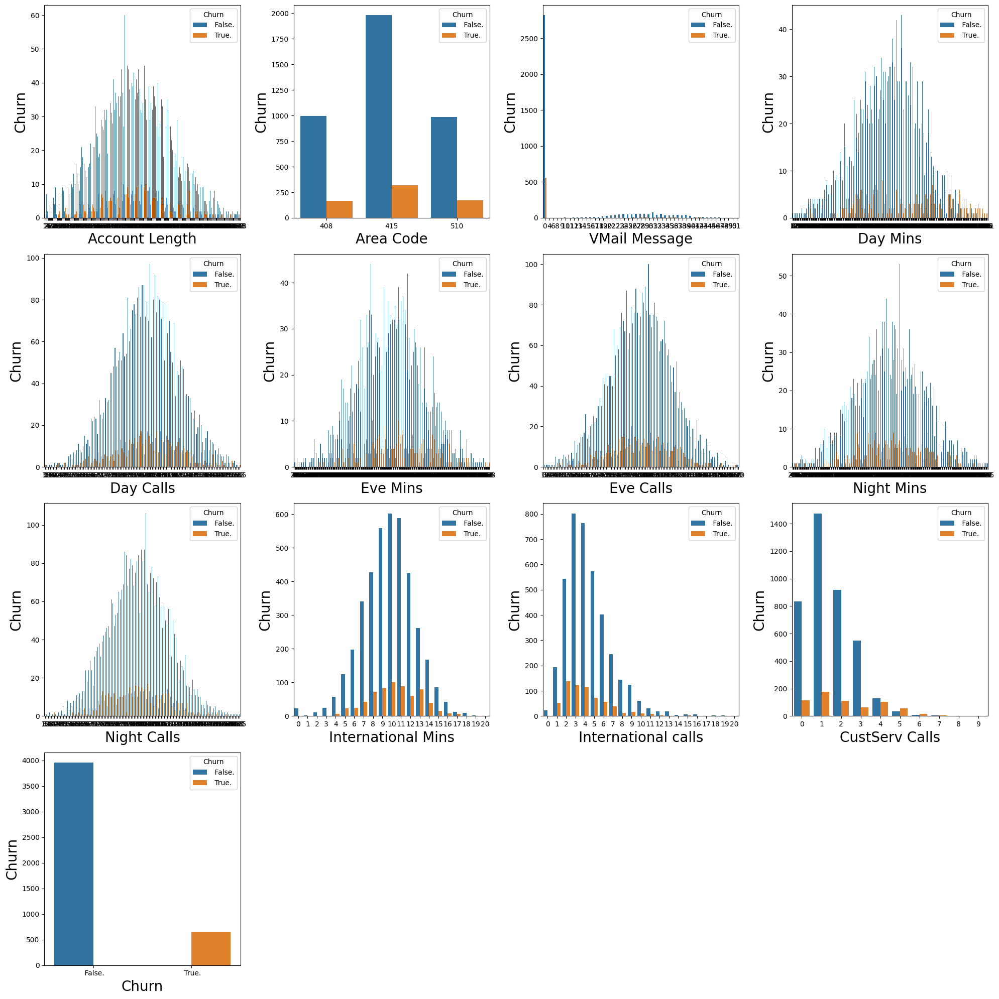

In [29]:
plt.figure(figsize=(20, 20))  # Adjust the figure size as needed
plotnumber = 1

# Assuming int32 is a list of columns with int32 data type
for column in int32:
    ax = plt.subplot(4, 4, plotnumber)
    sns.countplot(x=int32[column].dropna(axis=0), hue=data.Churn)
    plt.xlabel(column, fontsize=20)
    plt.ylabel('Churn', fontsize=20)
    plotnumber += 1

plt.tight_layout()
plt.show()

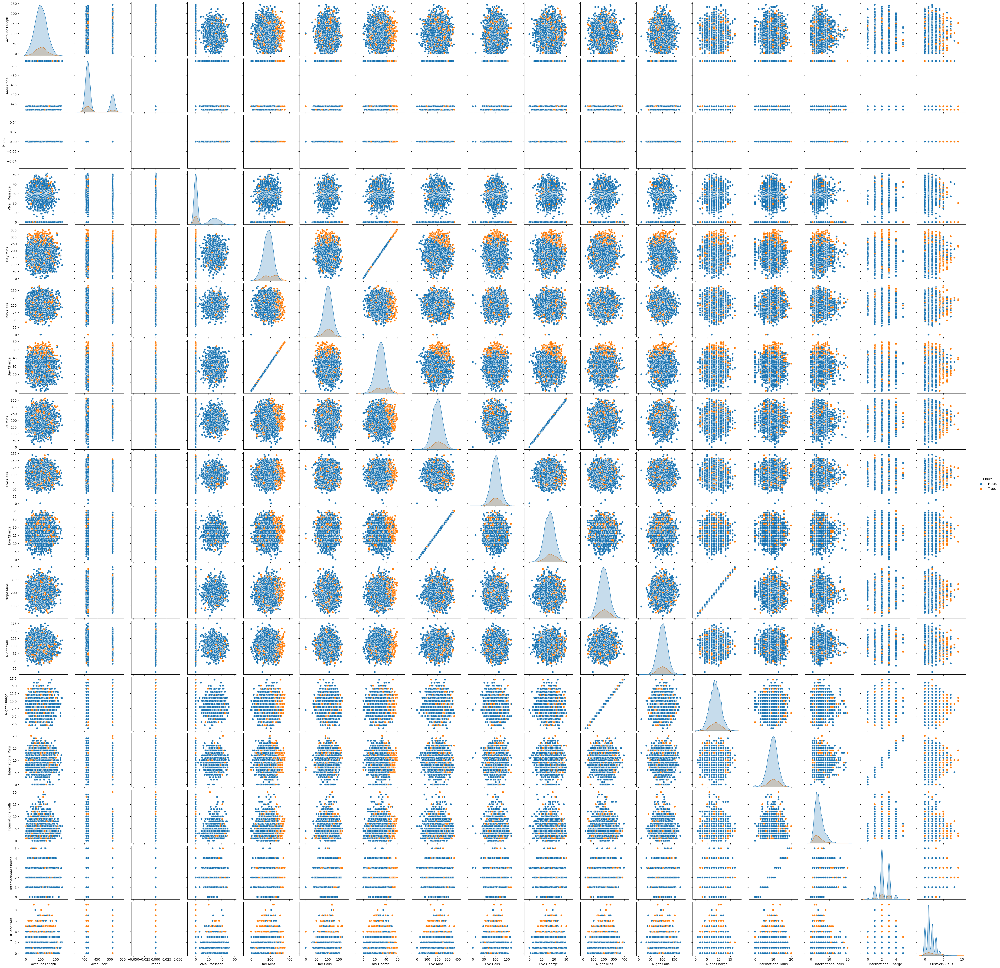

In [30]:
sns.pairplot(data=data, hue='Churn')
plt.show()

In [31]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4617 entries, 0 to 4616
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   State                 4617 non-null   object
 1   Account Length        4617 non-null   int32 
 2   Area Code             4617 non-null   int32 
 3   Phone                 4617 non-null   int32 
 4   International Plan    4617 non-null   object
 5   VMail Plan            4617 non-null   object
 6   VMail Message         4617 non-null   int32 
 7   Day Mins              4617 non-null   int32 
 8   Day Calls             4617 non-null   int32 
 9   Day Charge            4617 non-null   int32 
 10  Eve Mins              4617 non-null   int32 
 11  Eve Calls             4617 non-null   int32 
 12  Eve Charge            4617 non-null   int32 
 13  Night Mins            4617 non-null   int32 
 14  Night Calls           4617 non-null   int32 
 15  Night Charge          4617 non-null   

In [32]:
object = data[['State','International Plan','VMail Plan','Churn']]

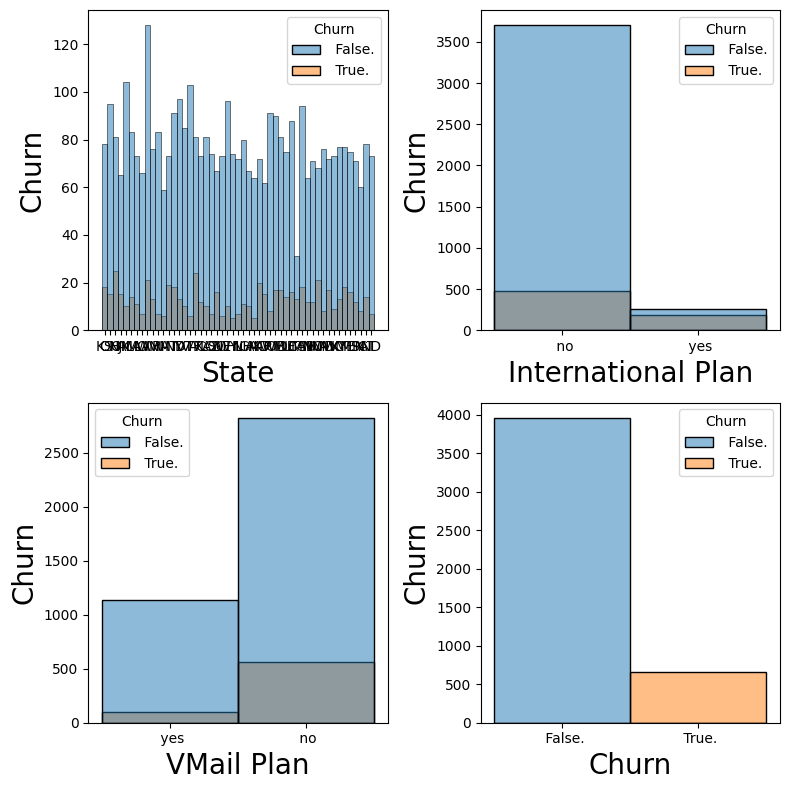

In [33]:
plt.figure(figsize=(8,8), facecolor='white')#canvas size
plotnumber = 1

for column in object:
    
    ax = plt.subplot(2,2,plotnumber)
    sns.histplot(x=object[column].dropna(axis=0)
                        ,hue=data.Churn)
    plt.xlabel(column,fontsize=20)
    plt.ylabel('Churn',fontsize=20)
    plotnumber+=1
plt.tight_layout()

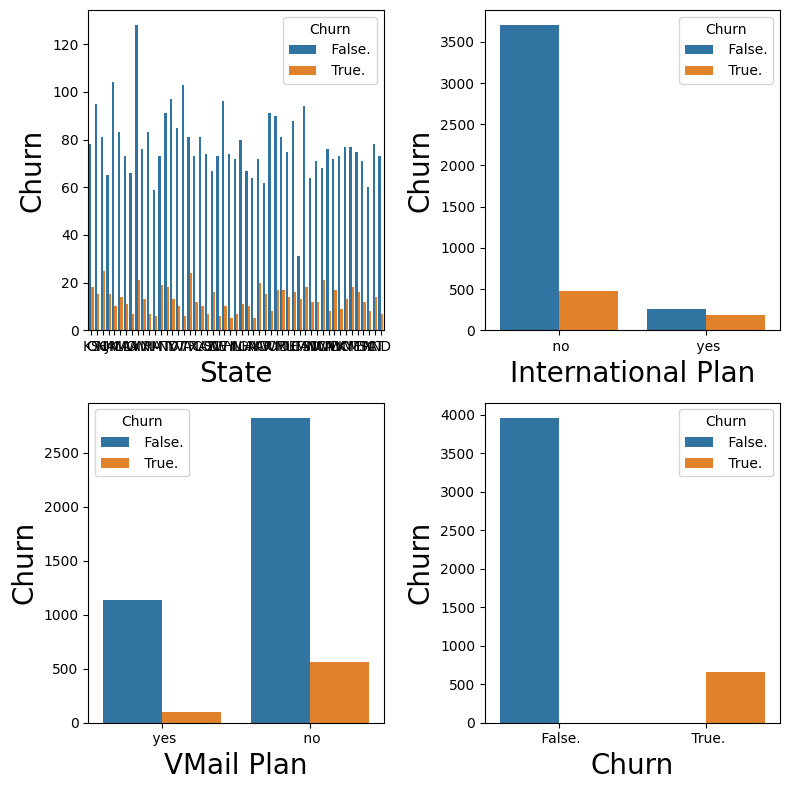

In [34]:
plt.figure(figsize=(8,8), facecolor='white')#canvas size
plotnumber = 1

for column in object:
    
    ax = plt.subplot(2,2,plotnumber)
    sns.countplot(x=object[column].dropna(axis=0)
                        ,hue=data.Churn)
    plt.xlabel(column,fontsize=20)
    plt.ylabel('Churn',fontsize=20)
    plotnumber+=1
plt.tight_layout()

In [35]:
data

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,...,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
0,KS,128,415,0,no,yes,25,265,110,45,...,99,16,244,91,11,10,3,2,1,False.
1,OH,107,415,0,no,yes,26,161,123,27,...,103,16,254,103,11,13,3,3,1,False.
2,NJ,137,415,0,no,no,0,243,114,41,...,110,10,162,104,7,12,5,3,0,False.
3,OH,84,408,0,yes,no,0,299,71,50,...,88,5,196,89,8,6,7,1,2,False.
4,OK,75,415,0,yes,no,0,166,113,28,...,122,12,186,121,8,10,3,2,3,False.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,NY,57,510,0,no,yes,25,144,81,24,...,112,15,158,122,7,8,6,2,3,False.
4613,NM,177,408,0,no,yes,29,189,91,32,...,96,25,163,116,7,15,1,4,3,False.
4614,VT,67,408,0,no,yes,33,127,126,21,...,129,25,200,91,9,13,3,3,1,False.
4615,MI,98,415,0,no,yes,23,168,98,28,...,117,19,165,96,7,14,3,3,0,False.


In [36]:
data.head(data.drop(columns=['Phone'], inplace=True))

,State,Account Length,Area Code,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
0,KS,128,415,no,yes,25,265,110,45,197,99,16,244,91,11,10,3,2,1,False.
1,OH,107,415,no,yes,26,161,123,27,195,103,16,254,103,11,13,3,3,1,False.
2,NJ,137,415,no,no,0,243,114,41,121,110,10,162,104,7,12,5,3,0,False.
3,OH,84,408,yes,no,0,299,71,50,61,88,5,196,89,8,6,7,1,2,False.
4,OK,75,415,yes,no,0,166,113,28,148,122,12,186,121,8,10,3,2,3,False.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,NY,57,510,no,yes,25,144,81,24,187,112,15,158,122,7,8,6,2,3,False.
4613,NM,177,408,no,yes,29,189,91,32,303,96,25,163,116,7,15,1,4,3,False.
4614,VT,67,408,no,yes,33,127,126,21,296,129,25,200,91,9,13,3,3,1,False.
4615,MI,98,415,no,yes,23,168,98,28,226,117,19,165,96,7,14,3,3,0,False.


In [37]:
data.shape

(4617, 20)

In [38]:
data.columns

Index(['State', 'Account Length', 'Area Code', 'International Plan',
       'VMail Plan', 'VMail Message', 'Day Mins', 'Day Calls', 'Day Charge',
       'Eve Mins', 'Eve Calls', 'Eve Charge', 'Night Mins', 'Night Calls',
       'Night Charge', 'International Mins', 'International calls',
       'International Charge', 'CustServ Calls', 'Churn'],
      dtype='object')

In [39]:
data

,State,Account Length,Area Code,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
0,KS,128,415,no,yes,25,265,110,45,197,99,16,244,91,11,10,3,2,1,False.
1,OH,107,415,no,yes,26,161,123,27,195,103,16,254,103,11,13,3,3,1,False.
2,NJ,137,415,no,no,0,243,114,41,121,110,10,162,104,7,12,5,3,0,False.
3,OH,84,408,yes,no,0,299,71,50,61,88,5,196,89,8,6,7,1,2,False.
4,OK,75,415,yes,no,0,166,113,28,148,122,12,186,121,8,10,3,2,3,False.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,NY,57,510,no,yes,25,144,81,24,187,112,15,158,122,7,8,6,2,3,False.
4613,NM,177,408,no,yes,29,189,91,32,303,96,25,163,116,7,15,1,4,3,False.
4614,VT,67,408,no,yes,33,127,126,21,296,129,25,200,91,9,13,3,3,1,False.
4615,MI,98,415,no,yes,23,168,98,28,226,117,19,165,96,7,14,3,3,0,False.


#### Handling the categorical value and converting to numerical by label encoder for feeding the machine.

In [40]:
from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Apply label encoding to categorical columns
data['International Plan'] = label_encoder.fit_transform(data['International Plan'])
data['VMail Plan'] = label_encoder.fit_transform(data['VMail Plan'])
data['State'] = label_encoder.fit_transform(data['State'])
data['Churn'] = label_encoder.fit_transform(data['Churn'])


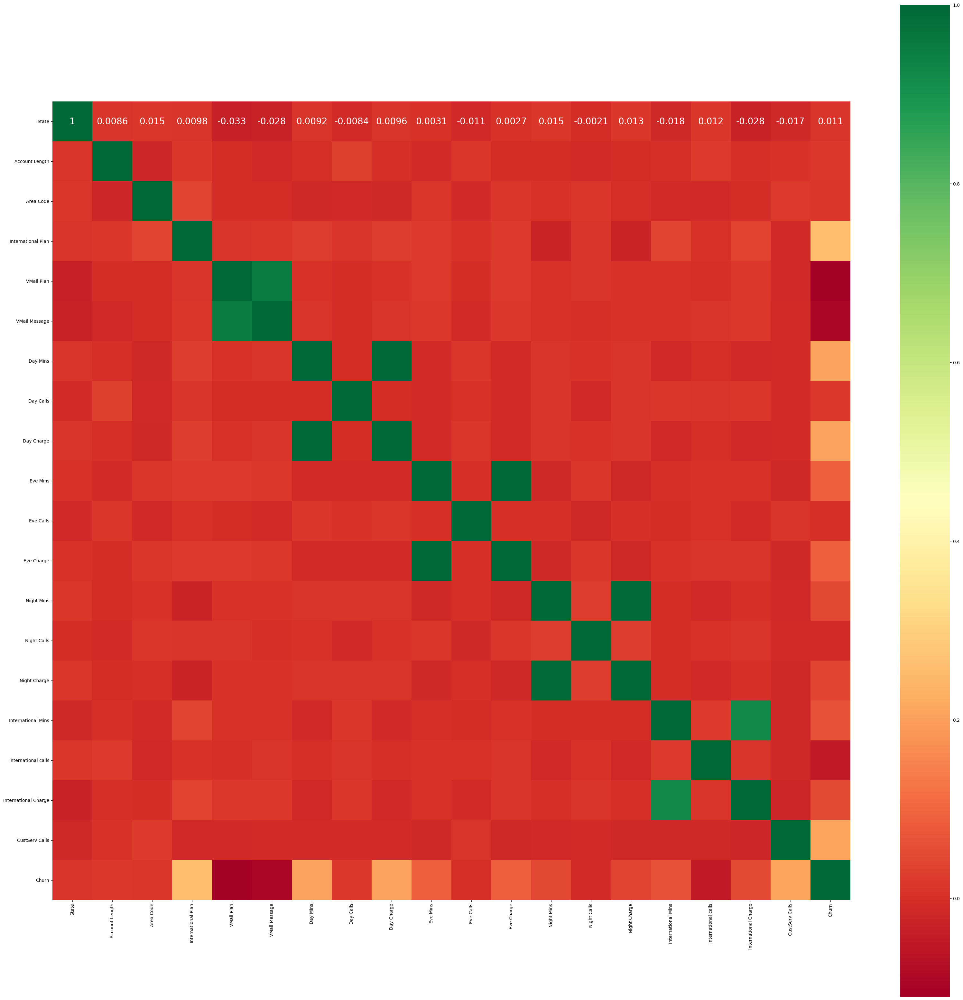

In [41]:
# Now, you can generate the correlation heatmap
plt.figure(figsize=(40, 40))
sns.heatmap(data.corr(), annot=True, cmap="RdYlGn", annot_kws={"size":20} ,square=True)
plt.show()

In [42]:
# Check correlation between 'Night Mins' and 'VMail Message'
correlation = data['VMail Plan'].corr(data['VMail Message'])
print("Correlation between 'VMail Plan' and 'VMail Message':", correlation)

Correlation between 'VMail Plan' and 'VMail Message': 0.9552799228441453


In [43]:
correlation = data['Day Charge'].corr(data['Day Mins'])
print("Correlation between 'Day Charge' and 'Day Mins':", correlation)

Correlation between 'Day Charge' and 'Day Mins': 0.9995021749227374


In [44]:
correlation = data['Eve Charge'].corr(data['Eve Mins'])
print("Correlation between 'Eve Charge' and 'Eve Mins':", correlation)

Correlation between 'Eve Charge' and 'Eve Mins': 0.9976627461914643


In [45]:
correlation = data['Night Charge'].corr(data['Night Mins'])
print("Correlation between 'Night Charge' and 'Night Mins':", correlation)

Correlation between 'Night Charge' and 'Night Mins': 0.9921213471642008


In [46]:
correlation = data['International Charge'].corr(data['International Mins'])
print("Correlation between 'International Charge' and 'International Mins':", correlation)

Correlation between 'International Charge' and 'International Mins': 0.9252580333468957


In [47]:
data.drop(columns=['VMail Plan', 'Day Mins', 'Eve Mins', 'Night Mins'], inplace=True)

In [48]:
data.head(2)

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
0,16,128,415,0,25,110,45,99,16,91,11,10,3,2,1,0
1,35,107,415,0,26,123,27,103,16,103,11,13,3,3,1,0


In [49]:
data.shape

(4617, 16)

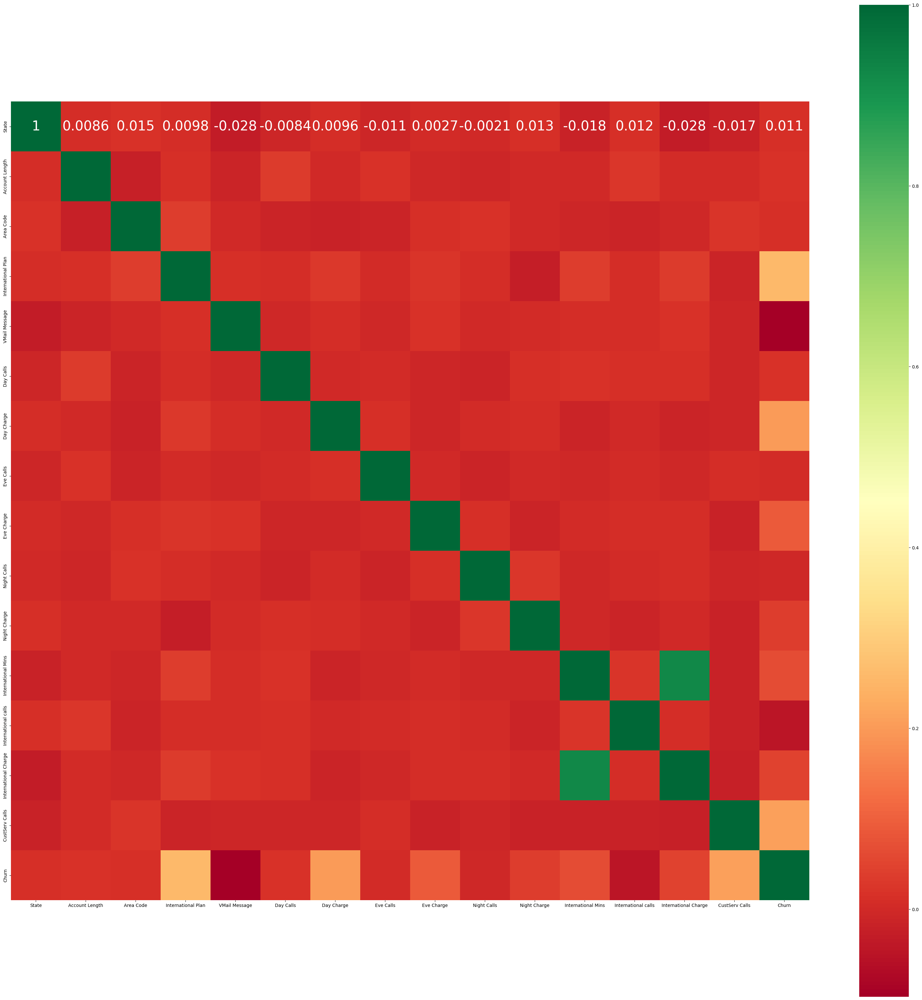

In [50]:
plt.figure(figsize=(40, 40))
sns.heatmap(data.corr(), annot=True, cmap="RdYlGn", annot_kws={"size":30},square =True)
plt.show()

## Note
* columns 'VMail Plan' , 'Day Mins' , 'Eve Mins','Night Mins' and 'International Mins' have been taken out as they had a very high correlation 95% < above
* Every object data type is now converted into interger data type by using Label Encoding
* majority of the data lies in the False region of the Churn, hence we have to smote the data

In [51]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4617 entries, 0 to 4616
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype
---  ------                --------------  -----
 0   State                 4617 non-null   int32
 1   Account Length        4617 non-null   int32
 2   Area Code             4617 non-null   int32
 3   International Plan    4617 non-null   int32
 4   VMail Message         4617 non-null   int32
 5   Day Calls             4617 non-null   int32
 6   Day Charge            4617 non-null   int32
 7   Eve Calls             4617 non-null   int32
 8   Eve Charge            4617 non-null   int32
 9   Night Calls           4617 non-null   int32
 10  Night Charge          4617 non-null   int32
 11  International Mins    4617 non-null   int32
 12  International calls   4617 non-null   int32
 13  International Charge  4617 non-null   int32
 14  CustServ Calls        4617 non-null   int32
 15  Churn                 4617 non-null   int32
dtypes: int

In [52]:
data.columns

Index(['State', 'Account Length', 'Area Code', 'International Plan',
       'VMail Message', 'Day Calls', 'Day Charge', 'Eve Calls', 'Eve Charge',
       'Night Calls', 'Night Charge', 'International Mins',
       'International calls', 'International Charge', 'CustServ Calls',
       'Churn'],
      dtype='object')

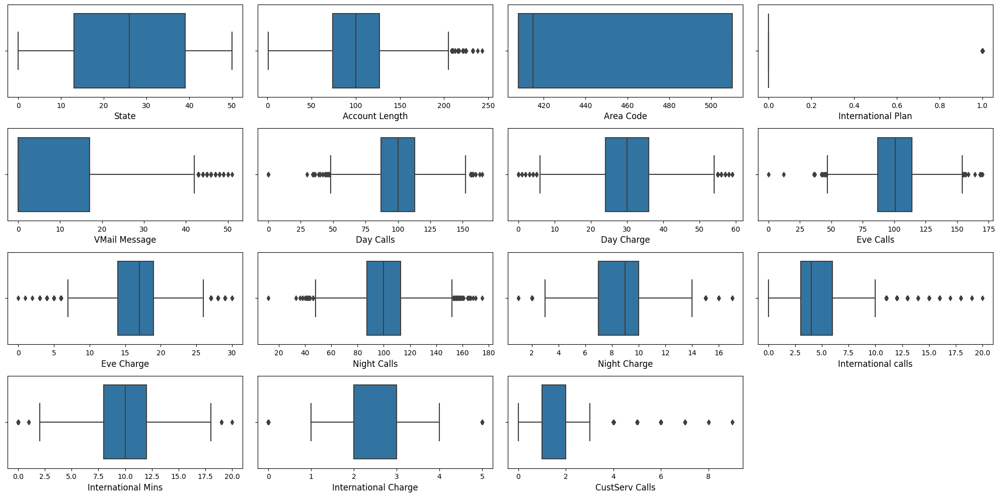

In [53]:
columns_for_boxplot = ['State', 'Account Length', 'Area Code', 'International Plan',
                       'VMail Message', 'Day Calls', 'Day Charge', 'Eve Calls', 'Eve Charge',
                       'Night Calls', 'Night Charge', 'International calls','International Mins',
                       'International Charge', 'CustServ Calls']

# Create boxplots for each column
plt.figure(figsize=(20, 10))  # Adjust the figure size as needed
for i, column in enumerate(columns_for_boxplot, 1):
    plt.subplot(4, 4, i)
    sns.boxplot(x=data[column])
    plt.xlabel(column, fontsize=12)

plt.tight_layout()
plt.show()

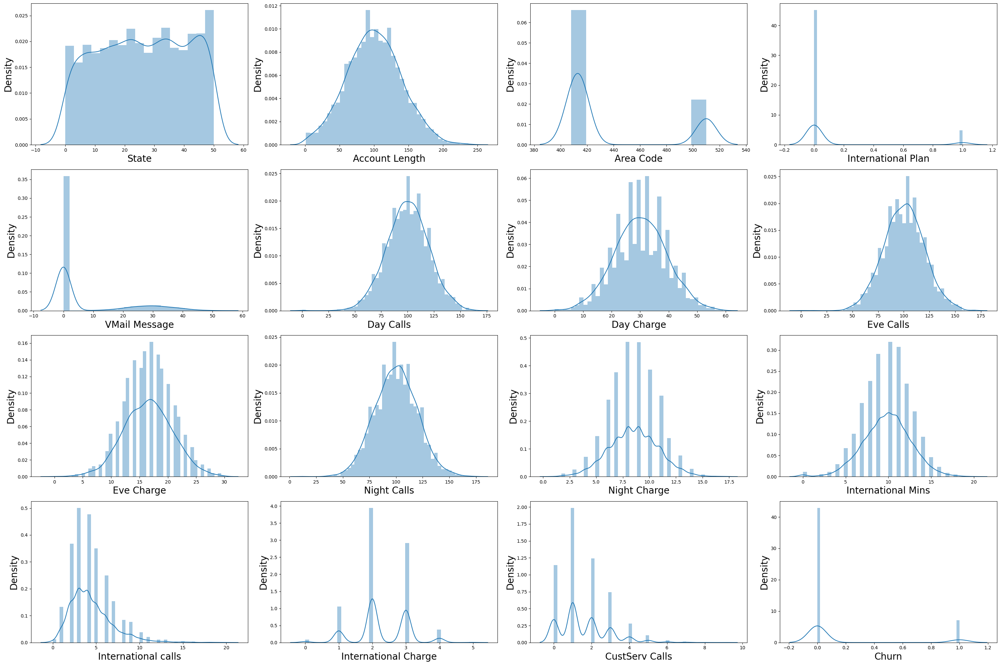

In [54]:
plt.figure(figsize=(30,20))
plotnumber=1

for column in data:
    ax=plt.subplot(4,4,plotnumber)
    sns.distplot(data[column])
    plt.xlabel(column, fontsize=20)
    plt.ylabel('Density', fontsize=20)
    plotnumber+=1
plt.tight_layout()  

# Removing the Outliers

## Intenational Mins

In [55]:
# using IQR to remove the outliers
IQR = stats.iqr(data['International Mins'], interpolation = 'midpoint')
IQR

4.0

In [56]:
# min and max limit calculation

# First quartile (Q1)
Q1 = data['International Mins'].quantile(0.25)

# Third Quartile (Q3)
Q3 = data['International Mins'].quantile(0.75)

# Getting the limits
min_limit = Q1 - 1.5*IQR
max_limit = Q3 + 1.5*IQR

In [57]:
min_limit

2.0

In [58]:
max_limit

18.0

In [59]:
data[data['International Mins'] > max_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
115,21,36,510,1,42,89,33,122,21,126,6,20,6,5,0,1
3906,16,104,408,0,0,105,32,96,12,123,10,19,4,5,1,0
3916,6,68,510,1,0,99,33,106,16,80,11,19,4,5,3,1
4396,17,55,415,0,37,89,33,141,19,121,14,19,2,5,1,0


In [60]:
data[data['International Mins'] < min_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
179,16,70,408,0,0,122,39,112,24,112,9,0,0,0,3,0
343,15,98,408,0,21,98,10,86,14,84,11,0,0,0,2,0
488,46,165,510,0,0,126,41,65,17,126,10,0,0,0,1,0
595,11,87,408,0,28,95,25,97,12,109,11,0,0,0,1,0
712,24,106,415,0,0,104,19,101,6,78,10,0,0,0,2,0
762,50,161,415,1,0,78,32,117,22,137,8,1,6,0,1,0
878,48,62,415,0,0,66,47,108,13,74,3,0,0,0,1,0
1028,16,70,415,0,0,114,37,113,18,122,10,0,0,0,1,0
1080,35,114,415,0,0,88,32,78,14,118,9,0,0,0,0,0
1400,45,115,415,0,0,90,22,75,16,114,7,0,0,0,3,0


In [61]:
len(data[data['International Mins'] > max_limit])

4

In [62]:
len(data[data['International Mins'] < min_limit])

26

<Axes: >

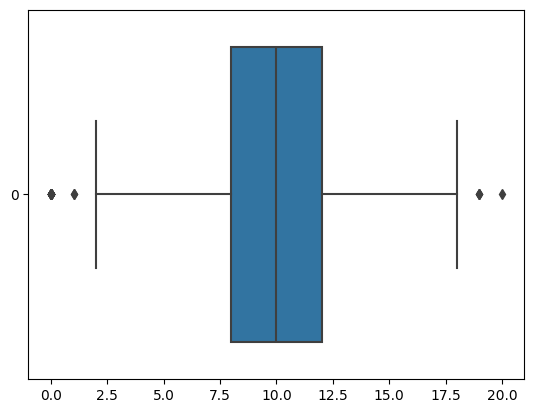

In [63]:
sns.boxplot(data['International Mins'], orient='h')

In [64]:
np.median(data['International Mins'])

10.0

In [65]:
np.mean(data['International Mins'])

9.834091401342864

In [66]:
# subtituting the value of outliers with median value
data.loc[data['International Mins'] > max_limit,'International Mins'] = np.median(data['International Mins'])

In [67]:
# subtituting the value of outliers with median value
data.loc[data['International Mins'] < min_limit,'International Mins'] = np.median(data['International Mins'])

In [68]:
data[data['International Mins'] > max_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn


In [69]:
data[data['International Mins'] < min_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn


<Axes: >

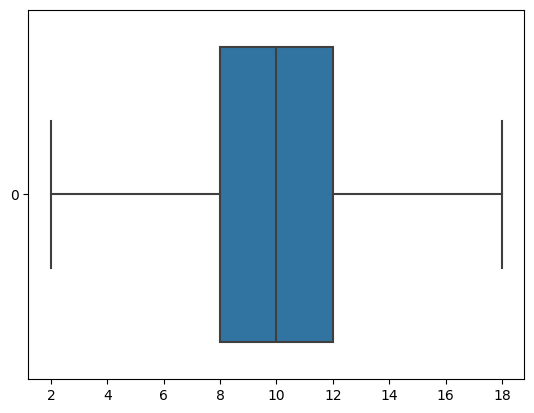

In [70]:
sns.boxplot(data['International Mins'], orient='h')

<Axes: xlabel='International Mins', ylabel='Density'>

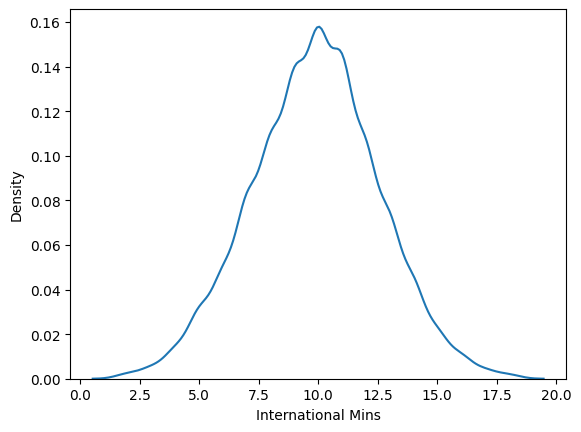

In [71]:
sns.kdeplot(data['International Mins'])

## Account Length

In [72]:
# using IQR to remove the outliers
IQR = stats.iqr(data['Account Length'], interpolation = 'midpoint')
IQR

53.0

In [73]:
# min and max limit calculation

# First quartile (Q1)
Q1 = data['Account Length'].quantile(0.25)

# Third Quartile (Q3)
Q3 = data['Account Length'].quantile(0.75)

# Getting the limits
min_limit = Q1 - 1.5*IQR
max_limit = Q3 + 1.5*IQR

In [74]:
min_limit

-5.5

In [75]:
max_limit

206.5

In [76]:
data[data['Account Length'] > max_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
197,43,208,510,0,0,67,55,113,14,102,8,10,6,2,2,1
238,50,215,510,0,0,148,14,91,10,110,10,10,9,2,0,0
309,41,209,415,0,0,128,38,92,21,74,8,8,4,2,3,0
416,8,224,510,1,0,99,29,103,13,102,9,5,2,1,1,1
817,44,243,510,0,0,92,16,63,13,118,11,6,6,1,2,0
1045,43,217,408,0,0,115,29,128,13,107,13,9,3,2,4,0
1093,45,210,408,0,0,121,17,71,12,67,11,6,8,1,2,0
1387,6,212,415,0,0,96,21,80,12,102,13,7,3,2,1,0
1408,32,232,408,0,0,104,28,115,16,77,5,11,3,3,1,0
1551,22,225,415,0,0,106,28,109,23,93,9,8,3,2,0,1


In [77]:
len(data[data['Account Length'] > max_limit])

23

In [78]:
data[data['Account Length'] < min_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn


In [79]:
np.median(data['Account Length'])

100.0

In [80]:
# subtituting the value of outliers with median value
data.loc[data['Account Length'] > max_limit,'Account Length'] = np.median(data['Account Length']) 

In [81]:
data[data['Account Length'] > max_limit] # to check if the outliers have been gone

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn


<Axes: >

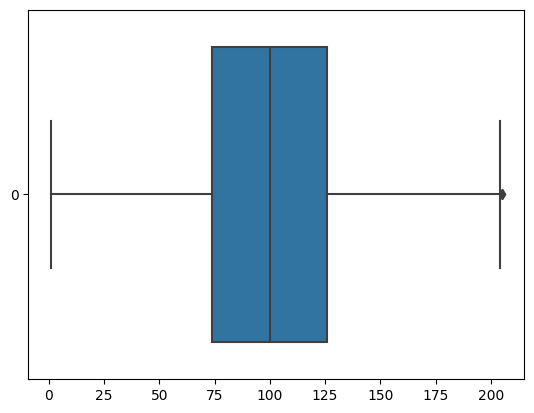

In [82]:
sns.boxplot(data['Account Length'], orient='h')

<Axes: xlabel='Account Length', ylabel='Density'>

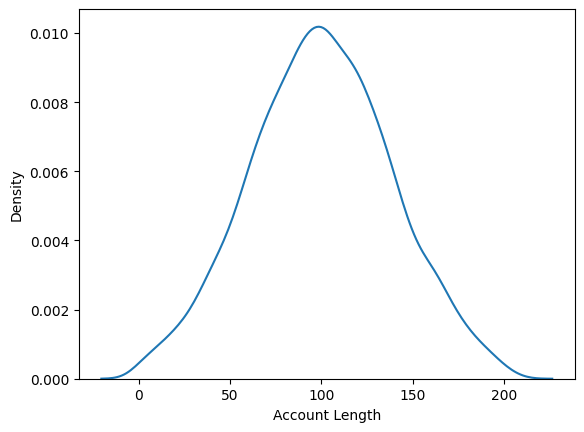

In [83]:
sns.kdeplot(data['Account Length'])

## VMail Message

In [84]:
IQR = stats.iqr(data['VMail Message'], interpolation='midpoint')
IQR

17.0

In [85]:
Q1 = data['VMail Message'].quantile(0.25)
 
Q3 =data['VMail Message'].quantile(0.75)

min_limit=Q1 - 1.5*IQR

max_limit=Q3 +1.5*IQR

In [86]:
min_limit

-25.5

In [87]:
max_limit

42.5

In [88]:
data.loc[data['VMail Message'] > max_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
71,23,162,510,0,46,97,38,84,16,61,11,12,2,3,0,0
149,39,145,408,0,43,97,43,95,13,86,12,11,4,3,2,0
268,24,64,510,0,48,104,16,101,11,89,6,4,4,1,0,0
277,41,144,408,0,48,96,32,67,10,106,9,6,2,1,2,1
423,15,96,415,0,45,124,42,77,11,102,11,10,2,2,3,0
599,35,75,510,0,46,62,36,111,17,126,11,9,6,2,0,0
615,44,48,510,0,43,111,29,64,17,96,10,8,5,2,1,0
790,3,92,415,1,45,88,47,103,16,76,4,7,3,2,0,0
845,9,144,415,0,51,98,48,109,16,85,8,10,4,2,1,0
872,36,149,510,0,43,79,35,122,14,80,10,10,3,2,1,0


In [89]:
len(data.loc[data['VMail Message'] > max_limit])

51

In [90]:
data.loc[data['VMail Message'] < min_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn


<Axes: >

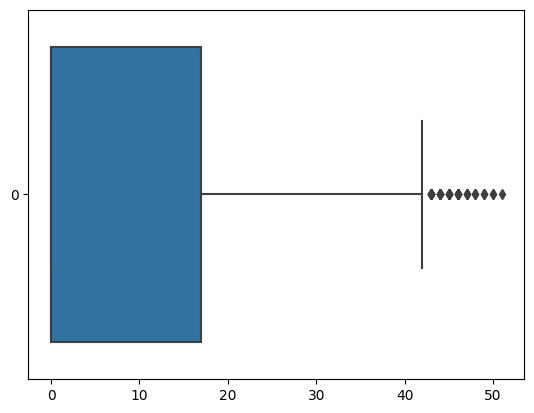

In [91]:
sns.boxplot(data['VMail Message'], orient='h')

In [92]:
np.mean(data['VMail Message'])

7.849902534113061

In [93]:
data.loc[data['VMail Message'] > max_limit, 'VMail Message'] = np.mean(data['VMail Message'])

In [94]:
data.loc[data['VMail Message'] > max_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn


<Axes: >

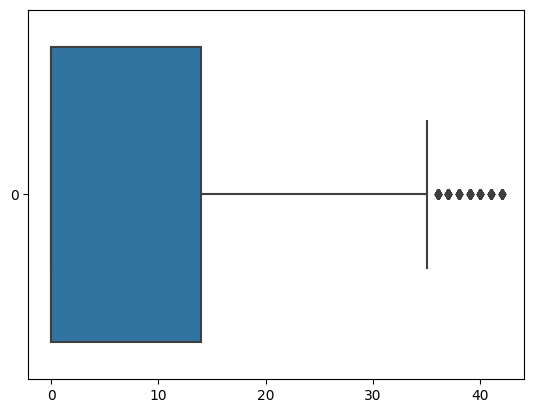

In [95]:
sns.boxplot(data['VMail Message'], orient='h')

In [96]:
data['VMail Message'] = np.sqrt(data['VMail Message'])

<Axes: >

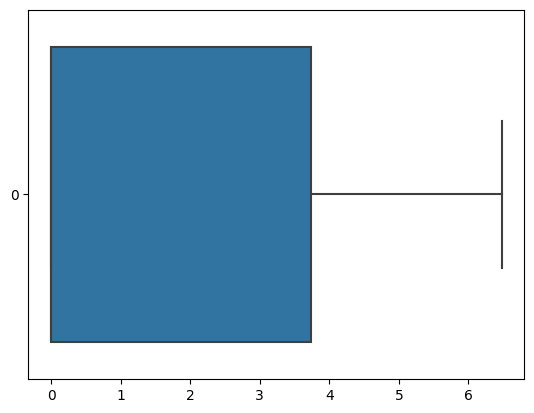

In [97]:
sns.boxplot(data['VMail Message'], orient='h')

<Axes: xlabel='VMail Message', ylabel='Density'>

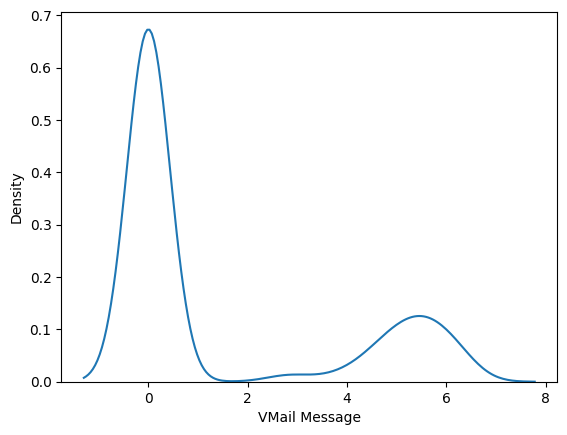

In [98]:
sns.kdeplot(data['VMail Message'])

## Day Calls

In [99]:
IQR = stats.iqr(data['Day Calls'], interpolation='midpoint')
IQR

26.0

In [100]:
Q1 = data['Day Calls'].quantile(0.25)
 
Q3 =data['Day Calls'].quantile(0.75)

min_limit=Q1 - 1.5*IQR

max_limit=Q3 +1.5*IQR

In [101]:
min_limit

48.0

In [102]:
max_limit

152.0

In [103]:
data.loc[data['Day Calls'] > max_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
315,19,39,408,0,0.000000,158,10,120,26,46,5,12,3,3,1,0
468,3,86,415,0,5.656854,163,12,121,14,105,11,11,5,3,3,0
1057,49,86,415,0,6.164414,158,20,119,11,103,6,13,4,3,1,0
1121,22,91,415,0,0.000000,165,26,121,14,81,10,11,4,3,5,1
1460,26,80,415,0,0.000000,160,33,87,13,76,8,9,3,2,3,0
1869,25,101,408,0,0.000000,156,40,106,23,93,12,13,8,3,1,1
2392,50,90,510,0,0.000000,158,21,83,22,103,10,11,7,2,1,0
2394,15,57,415,0,0.000000,157,32,70,14,117,9,11,5,3,3,0
4230,7,150,510,1,0.000000,156,19,78,11,98,9,15,4,4,1,1
4297,40,105,408,1,0.000000,156,46,69,22,93,8,11,3,3,3,1


In [104]:
data.loc[data['Day Calls'] < min_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
143,46,103,510,0,0.000000,47,41,84,16,96,9,11,4,3,1,0
415,8,113,415,0,0.000000,47,40,110,24,88,10,8,3,2,2,1
692,29,82,408,0,0.000000,36,31,134,23,104,8,5,7,1,4,0
740,44,67,510,0,4.472136,40,39,58,16,115,7,9,2,2,1,0
1144,30,155,408,0,0.000000,30,36,125,12,106,6,10,1,2,2,0
1322,8,2,415,1,0.000000,42,22,88,11,119,8,9,1,2,2,1
1345,41,98,415,0,0.000000,0,0,130,13,88,7,6,1,1,4,1
1346,38,106,408,1,0.000000,45,22,107,15,89,8,10,2,2,1,1
1397,46,101,510,0,0.000000,0,0,119,16,95,7,7,4,1,1,0
1422,50,107,510,0,5.567764,45,27,70,18,109,11,5,1,1,1,0


In [105]:
len(data.loc[data['Day Calls'] > max_limit])

12

In [106]:
len(data.loc[data['Day Calls'] < min_limit])

22

<Axes: >

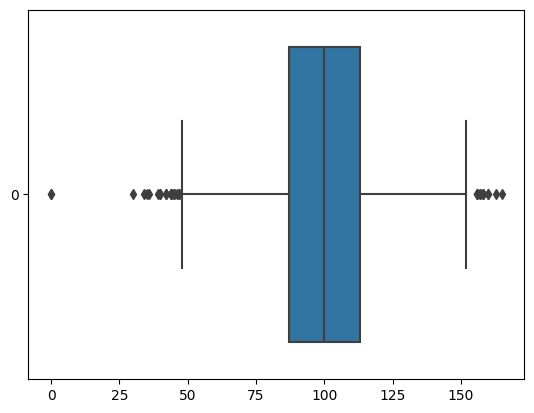

In [107]:
sns.boxplot(data['Day Calls'], orient='h')

In [108]:
np.median(data['Day Calls'])

100.0

In [109]:
np.mean(data['Day Calls'])

100.0543643058263

In [110]:
data.loc[data['Day Calls'] > max_limit, 'Day Calls'] = np.median(data['Day Calls'])

In [111]:
data.loc[data['Day Calls'] < min_limit, 'Day Calls'] = np.median(data['Day Calls'])

In [112]:
data.loc[data['Day Calls'] > max_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn


In [113]:
data.loc[data['Day Calls'] < min_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn


<Axes: >

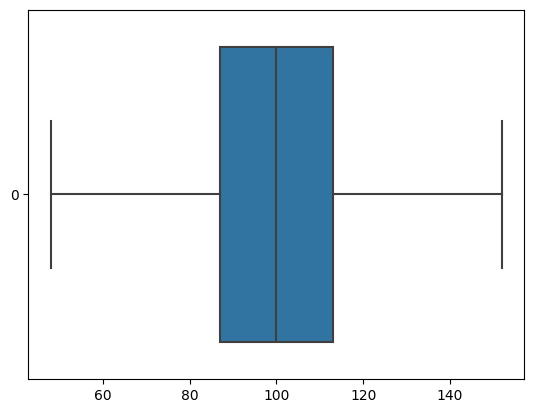

In [114]:
sns.boxplot(data['Day Calls'], orient='h')

<Axes: xlabel='Day Calls', ylabel='Density'>

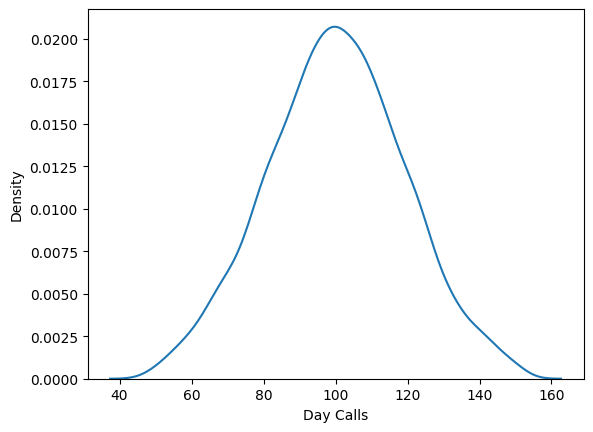

In [115]:
sns.kdeplot(data['Day Calls'])

## Day Charge

In [116]:
IQR = stats.iqr(data['Day Charge'], interpolation='midpoint')
IQR

12.0

In [117]:
Q1 = data['Day Charge'].quantile(0.25)
 
Q3 =data['Day Charge'].quantile(0.75)

min_limit=Q1 - 1.5*IQR

max_limit=Q3 +1.5*IQR

In [118]:
min_limit

6.0

In [119]:
max_limit

54.0

In [120]:
data.loc[data['Day Charge'] > max_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
15,34,161,415,0,0.0,67,56,97,27,128,7,5,9,1,4,1
156,35,83,415,0,0.0,120,57,116,19,114,6,15,7,4,0,1
197,43,100,510,0,0.0,67,55,113,14,102,8,10,6,2,2,1
365,5,154,415,0,0.0,75,59,94,18,100,11,10,9,2,1,1
605,24,112,415,0,0.0,77,57,109,18,132,11,12,8,3,2,1
975,8,129,510,0,0.0,118,56,104,16,83,8,10,6,2,0,1
985,34,64,415,1,0.0,55,58,79,21,102,12,13,9,3,1,1
1679,36,82,510,0,0.0,73,56,120,17,102,12,10,6,2,0,1
2028,41,93,510,0,0.0,106,55,89,12,114,13,8,3,2,1,1
2412,48,89,415,0,0.0,112,55,110,14,97,7,7,1,2,1,1


In [121]:
data.loc[data['Day Charge'] < min_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
685,5,63,415,0,5.656854,113,5,113,15,101,10,8,7,2,1,0
741,29,66,415,0,0.000000,133,5,61,23,120,5,11,3,3,0,0
1052,37,98,415,1,0.000000,67,2,90,21,88,7,7,9,2,1,0
1076,50,53,415,0,5.196152,119,4,96,17,64,10,6,7,1,1,0
1130,38,122,415,0,0.000000,62,5,89,15,58,11,12,2,3,1,0
1345,41,98,415,0,0.000000,100,0,130,13,88,7,6,1,1,4,1
1397,46,101,510,0,0.000000,100,0,119,16,95,7,7,4,1,1,0
1621,40,138,510,0,4.582576,149,3,109,11,111,8,7,1,2,0,0
1986,48,70,415,0,0.000000,100,1,83,11,89,7,12,1,3,0,0
2124,16,43,415,0,0.000000,117,4,97,13,96,12,10,3,2,3,0


<Axes: >

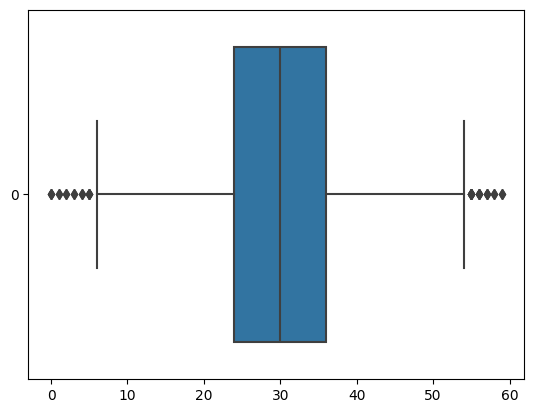

In [122]:
sns.boxplot(data['Day Charge'], orient='h')

In [123]:
len(data.loc[data['Day Charge'] > max_limit])

19

In [124]:
len(data.loc[data['Day Charge'] < min_limit])

15

In [125]:
np.median(data['Day Charge'])

30.0

In [126]:
np.mean(data['Day Charge'])

30.180853367987872

In [127]:
data.loc[data['Day Charge'] > max_limit, 'Day Charge'] = np.median(data['Day Charge'])

In [128]:
data.loc[data['Day Charge'] < min_limit, 'Day Charge'] = np.median(data['Day Charge'])

In [129]:
data.loc[data['Day Charge'] > max_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn


In [130]:
data.loc[data['Day Charge'] < min_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn


<Axes: >

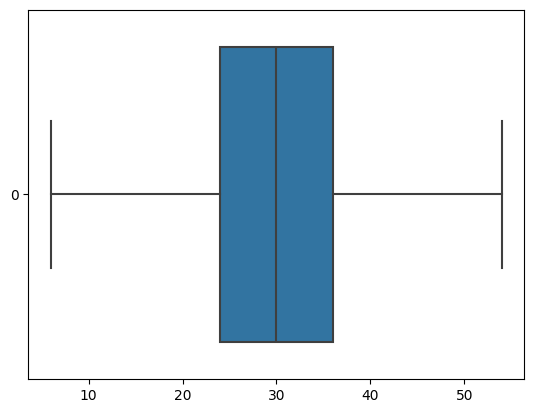

In [131]:
sns.boxplot(data['Day Charge'], orient='h')

<Axes: xlabel='Day Charge', ylabel='Density'>

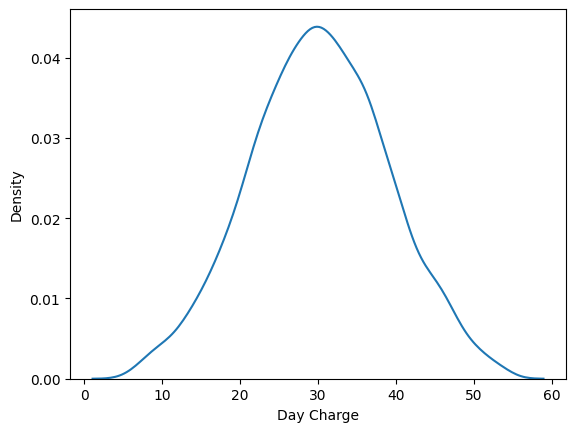

In [132]:
sns.kdeplot(data['Day Charge'])

## Eve Calls

In [133]:
IQR = stats.iqr(data['Eve Calls'], interpolation='midpoint')
IQR

27.0

In [134]:
Q1 = data['Eve Calls'].quantile(0.25)
 
Q3 =data['Eve Calls'].quantile(0.75)

min_limit=Q1 - 1.5*IQR

max_limit=Q3 +1.5*IQR

In [135]:
min_limit

46.5

In [136]:
max_limit

154.5

In [137]:
data.loc[data['Eve Calls'] > max_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
58,48,68,415,0,0.000000,70,25,164,20,103,5,12,3,3,3,0
301,9,127,415,0,0.000000,106,45,168,22,119,9,5,2,1,1,1
1020,11,115,415,0,5.744563,72,24,157,16,138,10,14,3,3,2,0
1071,38,134,408,0,0.000000,122,34,155,20,107,8,5,9,1,1,0
1706,20,54,415,0,0.000000,113,46,156,10,117,12,11,3,3,1,0
2227,40,41,408,0,0.000000,92,40,155,19,90,9,10,6,2,2,0
3121,10,98,408,0,0.000000,77,28,155,11,105,6,8,7,2,1,0
3157,2,127,415,1,0.000000,60,24,159,15,122,7,6,4,1,4,1
3219,34,150,415,0,5.916080,72,23,170,28,105,9,8,2,2,2,0
3940,50,44,415,0,4.472136,105,31,169,16,121,5,11,3,3,1,0


In [138]:
data.loc[data['Eve Calls'] < min_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
154,36,96,415,0,0.000000,115,44,46,12,87,12,11,4,3,5,0
475,2,74,510,0,0.000000,111,25,42,12,83,13,9,6,2,3,0
646,49,153,408,0,5.291503,74,40,37,19,103,7,15,9,4,0,0
960,2,5,415,0,0.000000,106,33,12,15,85,9,13,3,3,3,0
1266,12,42,415,0,0.000000,127,26,45,13,128,7,9,3,2,0,0
1615,6,74,408,0,0.000000,95,26,36,18,77,12,7,3,2,2,0
1730,32,161,408,0,0.000000,121,18,46,21,131,11,12,3,3,2,0
1856,5,86,408,0,0.000000,106,29,44,25,108,6,9,5,2,1,0
2592,45,163,415,0,0.000000,100,34,46,15,116,9,12,3,3,5,0
2853,19,105,415,0,4.582576,112,24,43,16,93,12,8,3,2,2,0


In [139]:
len(data.loc[data['Eve Calls'] > max_limit])

12

In [140]:
len(data.loc[data['Eve Calls'] < min_limit])

13

<Axes: >

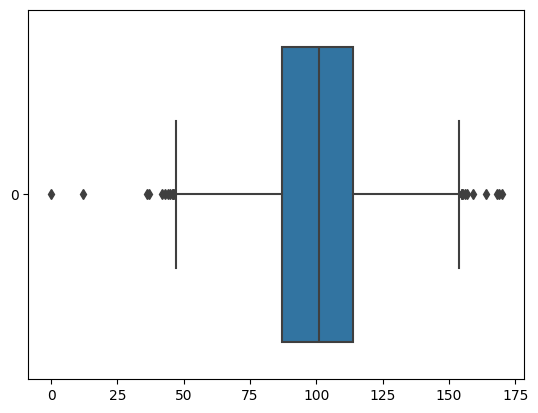

In [141]:
sns.boxplot(data['Eve Calls'], orient='h')

In [142]:
np.median(data['Eve Calls'])

101.0

In [143]:
np.mean(data['Eve Calls'])

100.17977041368854

In [144]:
data.loc[data['Eve Calls'] > max_limit, 'Eve Calls'] = np.median(data['Eve Calls'])

In [145]:
data.loc[data['Eve Calls'] < min_limit, 'Eve Calls'] = np.median(data['Eve Calls'])

In [146]:
data.loc[data['Eve Calls'] > max_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn


In [147]:
data.loc[data['Eve Calls'] < min_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn


<Axes: >

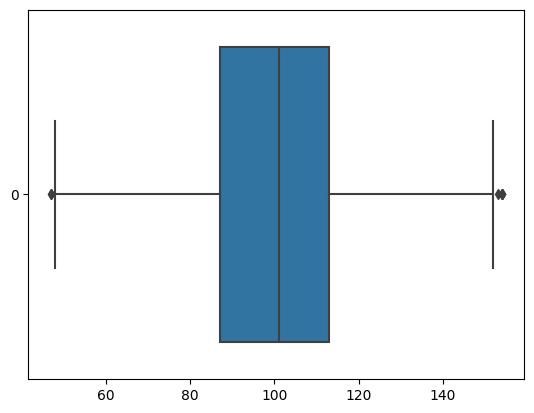

In [148]:
sns.boxplot(data['Eve Calls'], orient='h')

<Axes: xlabel='Eve Calls', ylabel='Density'>

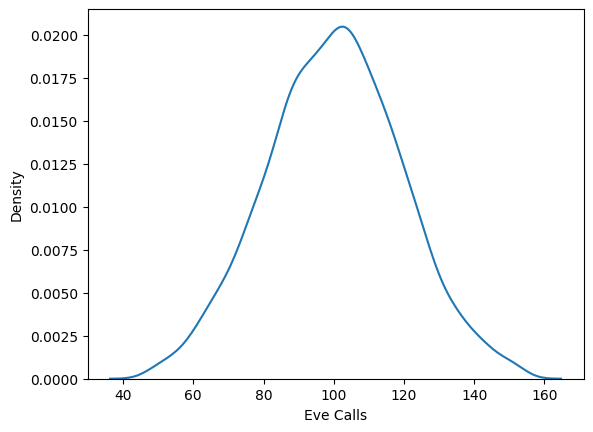

In [149]:
sns.kdeplot(data['Eve Calls'])

## Eve Charge

In [150]:
IQR = stats.iqr(data['Eve Charge'], interpolation='midpoint')
IQR

5.0

In [151]:
Q1 = data['Eve Charge'].quantile(0.25)
 
Q3 =data['Eve Charge'].quantile(0.75)

min_limit=Q1 - 1.5*IQR

max_limit=Q3 +1.5*IQR

In [152]:
min_limit

6.5

In [153]:
max_limit

26.5

In [154]:
data.loc[data['Eve Charge'] > max_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
6,19,121,510,0,4.898979,88,37,108,29,118,9,7,7,2,3,0
8,18,117,408,0,0.000000,97,31,80,29,90,9,8,4,2,1,0
15,34,161,415,0,0.000000,67,30,97,27,128,7,5,9,1,4,1
201,8,62,408,0,0.000000,101,30,93,27,131,11,11,1,3,2,0
302,39,121,408,0,0.000000,108,28,68,29,87,13,11,3,3,0,1
383,15,117,415,1,4.690416,82,33,82,27,120,10,3,5,1,1,0
419,33,115,415,0,0.000000,98,31,73,27,106,9,7,6,2,2,0
438,50,113,510,0,0.000000,93,26,106,28,123,8,13,3,3,1,0
507,24,92,415,0,0.000000,122,26,88,28,117,12,5,2,1,3,1
529,7,100,510,1,0.000000,110,11,115,28,99,9,12,9,3,0,0


In [155]:
data.loc[data['Eve Charge'] < min_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
3,35,84,408,1,0.000000,71,50,88,5,89,8,6,7,1,2,0
22,3,130,415,0,0.000000,112,31,99,6,78,8,9,19,2,0,0
32,18,172,408,0,0.000000,121,36,115,2,78,13,12,10,3,3,0
57,5,121,408,0,5.477226,129,33,77,6,77,8,5,3,1,3,1
77,34,144,408,0,0.000000,117,10,85,6,99,7,8,7,2,4,1
95,0,104,408,0,0.000000,106,47,113,6,137,7,9,5,2,1,0
186,34,106,408,0,0.000000,74,26,139,5,103,8,10,4,2,1,0
355,21,31,415,0,0.000000,105,28,93,6,98,9,12,2,3,1,0
533,36,125,415,0,6.000000,117,34,78,3,104,5,5,3,1,1,0
534,18,67,510,0,0.000000,97,52,123,5,99,11,9,10,2,4,0


In [156]:
len(data.loc[data['Eve Charge'] > max_limit])

52

In [157]:
len(data.loc[data['Eve Charge'] < min_limit])

54

<Axes: >

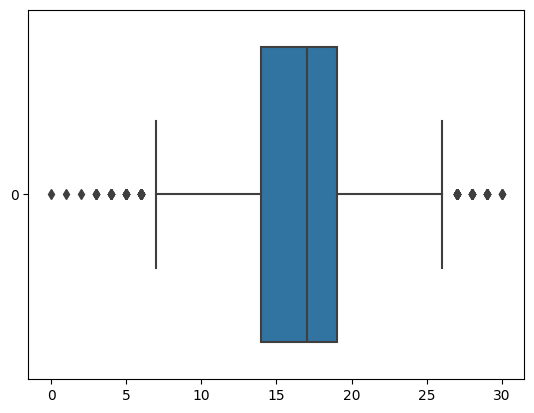

In [158]:
sns.boxplot(data['Eve Charge'], orient='h')

In [159]:
np.median(data['Eve Charge'])

17.0

In [160]:
np.mean(data['Eve Charge'])

16.541260558804417

In [161]:
data.loc[data['Eve Charge'] > max_limit, 'Eve Charge'] = np.median(data['Eve Charge'])

In [162]:
data.loc[data['Eve Charge'] < min_limit, 'Eve Charge'] = np.median(data['Eve Charge'])

In [163]:
data.loc[data['Eve Charge'] > max_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn


In [164]:
data.loc[data['Eve Charge'] < min_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn


<Axes: >

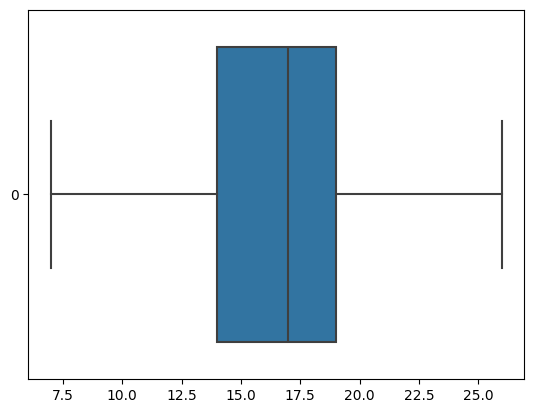

In [165]:
sns.boxplot(data['Eve Charge'], orient='h')

<Axes: xlabel='Eve Charge', ylabel='Density'>

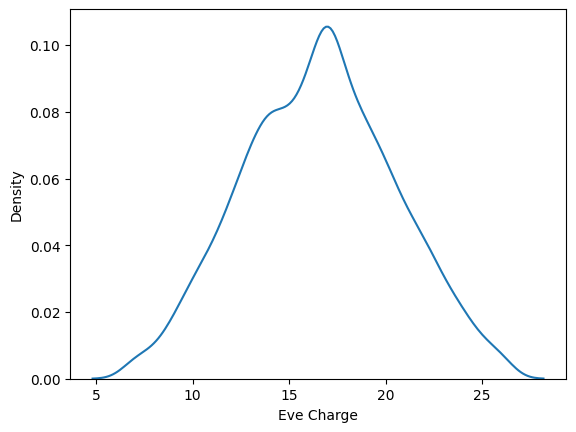

In [166]:
sns.kdeplot(data['Eve Charge'])

## Night Calls

In [167]:
IQR = stats.iqr(data['Night Calls'], interpolation='midpoint')
IQR

26.0

In [168]:
Q1 = data['Night Calls'].quantile(0.25)
 
Q3 =data['Night Calls'].quantile(0.75)

min_limit=Q1 - 1.5*IQR

max_limit=Q3 +1.5*IQR

In [169]:
min_limit

48.0

In [170]:
max_limit

152.0

In [171]:
data.loc[data['Night Calls'] > max_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
429,37,49,510,0,0.000000,69,20,92,23,153,9,12,7,3,2,0
493,39,129,415,0,5.744563,104,20,88,23,175,11,5,2,1,2,0
586,43,90,408,1,0.000000,97,37,134,17,154,9,8,4,2,1,0
901,6,23,510,0,0.000000,107,54,115,21,158,6,11,3,3,2,1
1109,13,118,415,0,0.000000,112,23,60,15,155,9,7,1,2,0,0
1200,46,100,415,0,5.000000,90,36,92,21,157,8,11,4,3,1,0
1296,21,79,415,0,0.000000,110,36,121,19,157,10,8,3,2,2,0
1748,26,71,510,0,4.795832,82,29,136,22,154,12,14,7,3,1,0
1810,17,124,415,0,0.000000,103,32,116,20,153,10,11,5,3,0,0
2288,29,34,415,0,0.000000,74,32,84,10,166,9,8,4,2,0,0


In [172]:
data.loc[data['Night Calls'] < min_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
315,19,39,408,0,0.000000,100,10,120,26,46,5,12,3,3,1,0
326,1,121,408,0,5.916080,95,11,69,17,42,8,11,4,3,1,0
335,17,151,408,0,4.123106,97,36,90,11,44,7,8,4,2,1,0
395,42,98,415,0,4.690416,89,47,143,7,42,4,9,5,2,0,0
2659,36,15,415,0,0.000000,130,20,86,18,33,10,16,5,4,2,0
2903,8,97,415,0,5.656854,94,31,120,22,38,9,6,4,1,5,0
2988,45,105,415,0,0.000000,96,44,97,14,36,10,12,5,3,3,0
3535,33,83,510,0,5.567764,87,22,110,15,40,7,14,6,3,1,0
4079,31,119,408,0,0.000000,83,48,124,18,42,6,11,4,2,1,1
4085,49,159,415,0,0.000000,107,30,114,16,41,7,9,4,2,7,0


In [173]:
len(data.loc[data['Night Calls'] > max_limit])

26

In [174]:
len(data.loc[data['Night Calls'] < min_limit])

16

<Axes: >

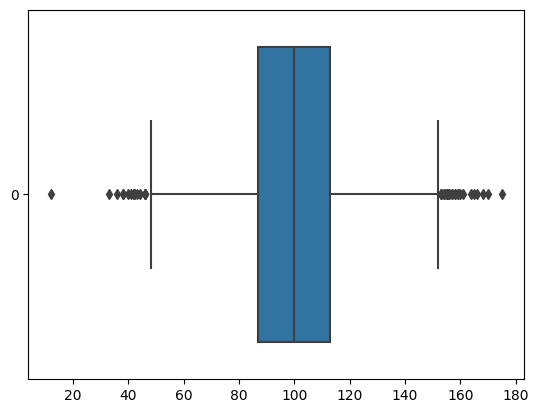

In [175]:
sns.boxplot(data['Night Calls'], orient='h')

In [176]:
np.median(data['Night Calls'])

100.0

In [177]:
np.mean(data['Night Calls'])

99.94411955815464

In [178]:
data.loc[data['Night Calls'] > max_limit, 'Night Calls'] = np.median(data['Night Calls'])

In [179]:
data.loc[data['Night Calls'] < min_limit, 'Night Calls'] = np.median(data['Night Calls'])

In [180]:
data.loc[data['Night Calls'] > max_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn


In [181]:
data.loc[data['Night Calls'] < min_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn


<Axes: >

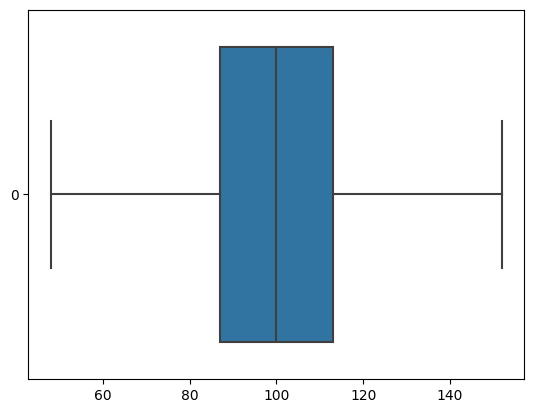

In [182]:
sns.boxplot(data['Night Calls'], orient='h')

<Axes: xlabel='Night Calls', ylabel='Density'>

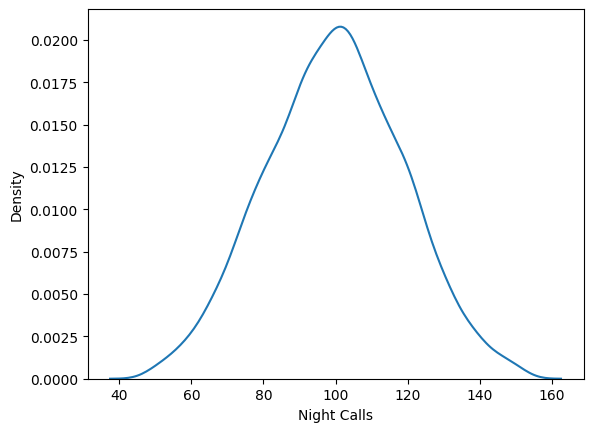

In [183]:
sns.kdeplot(data['Night Calls'])

## Night Charge

In [184]:
IQR = stats.iqr(data['Night Charge'], interpolation='midpoint')
IQR

3.0

In [185]:
Q1 = data['Night Charge'].quantile(0.25)
 
Q3 =data['Night Charge'].quantile(0.75)

min_limit=Q1 - 1.5*IQR

max_limit=Q3 +1.5*IQR

In [186]:
min_limit

2.5

In [187]:
max_limit

14.5

In [188]:
data.loc[data['Night Charge'] > max_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
244,45,108,408,0,0.000000,99,33,60,22,75,15,9,3,2,0,1
444,48,85,408,1,0.000000,107,28,126,16,110,15,9,7,2,2,0
862,4,75,510,0,6.164414,132,27,113,12,115,15,13,3,3,3,0
918,38,52,408,0,0.000000,67,36,108,18,130,15,5,2,1,1,0
922,48,80,415,0,0.000000,121,40,51,12,106,16,9,5,2,1,0
1202,24,86,415,0,0.000000,96,14,63,18,75,15,12,3,3,0,0
1238,35,147,415,1,4.898979,118,37,116,17,111,15,8,4,2,3,0
1317,29,89,415,0,5.385165,80,27,136,23,147,17,7,5,2,2,0
1375,46,84,415,0,6.480741,112,36,107,16,117,15,11,10,3,0,0
1445,13,55,510,0,2.828427,104,37,94,14,114,16,9,2,2,1,0


In [189]:
data.loc[data['Night Charge'] < min_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
116,31,64,510,0,0.000000,83,27,109,12,122,2,14,3,3,1,0
835,10,27,510,0,0.000000,75,12,117,17,71,2,9,3,2,1,0
883,50,42,408,0,0.000000,84,24,113,21,117,2,8,12,2,1,0
992,22,45,510,0,5.099020,104,15,119,12,103,2,7,5,2,1,0
999,27,165,415,0,0.000000,109,35,94,14,91,2,7,3,2,0,0
1072,24,164,408,0,5.000000,88,37,99,12,60,2,14,6,3,1,0
1113,12,152,415,0,0.000000,98,35,82,24,121,1,10,4,2,1,0
1260,0,76,415,0,4.690416,107,27,136,14,102,1,9,4,2,3,0
1313,6,100,415,0,0.000000,130,40,69,14,122,2,7,1,1,2,0
1512,24,22,408,0,3.741657,100,33,103,18,91,2,4,1,1,1,0


In [190]:
len(data.loc[data['Night Charge'] > max_limit])

21

In [191]:
len(data.loc[data['Night Charge'] < min_limit])

21

<Axes: >

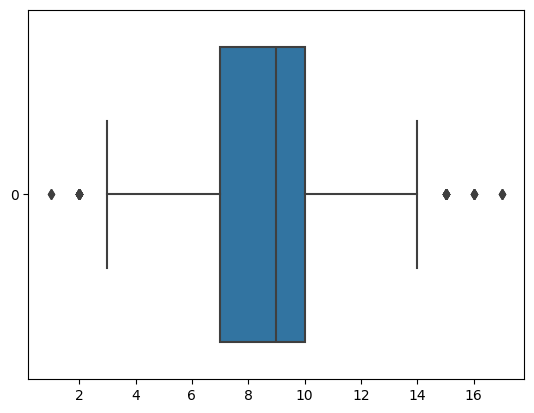

In [192]:
sns.boxplot(data['Night Charge'], orient='h')

In [193]:
np.median(data['Night Charge'])

9.0

In [194]:
np.mean(data['Night Charge'])

8.525449426034221

In [195]:
data.loc[data['Night Charge'] > max_limit, 'Night Charge'] = np.median(data['Night Charge'])

In [196]:
data.loc[data['Night Charge'] < min_limit, 'Night Charge'] = np.median(data['Night Charge'])

In [197]:
data.loc[data['Night Charge'] > max_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn


In [198]:
data.loc[data['Night Charge'] < min_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn


<Axes: >

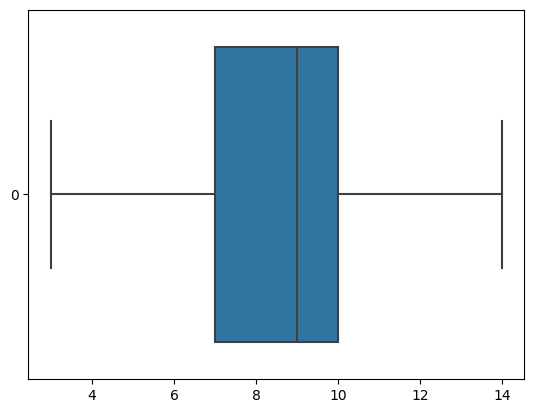

In [199]:
sns.boxplot(data['Night Charge'], orient='h')

<Axes: xlabel='Night Calls', ylabel='Density'>

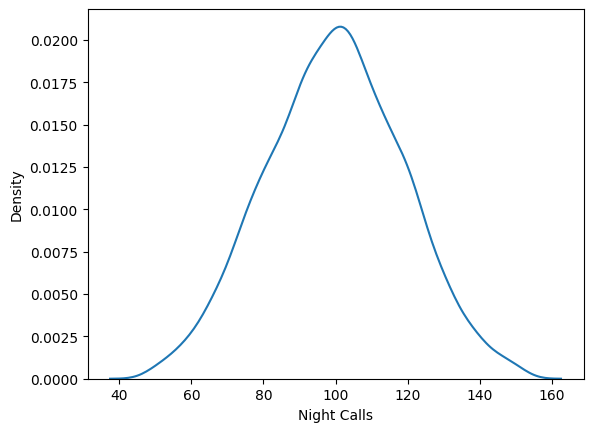

In [200]:
sns.kdeplot(data['Night Calls'])

## International Calls

In [201]:
IQR = stats.iqr(data['International calls'], interpolation='midpoint')
IQR

3.0

In [202]:
Q1 = data['International calls'].quantile(0.25)
 
Q3 =data['International calls'].quantile(0.75)

min_limit=Q1 - 1.5*IQR

max_limit=Q3 +1.5*IQR

In [203]:
min_limit

-1.5

In [204]:
max_limit

10.5

In [205]:
data.loc[data['International calls'] > max_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
22,3,130,415,0,0.000000,112,31,99,17,78,8,9,19,2,0,0
41,20,135,408,1,6.403124,85,29,107,17,78,5,14,15,3,0,1
153,39,56,415,0,0.000000,112,38,118,21,142,6,6,11,1,1,0
182,34,67,408,0,6.000000,111,19,94,20,103,7,9,12,2,2,0
185,32,73,415,0,0.000000,145,36,135,22,92,10,10,13,2,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4386,36,88,408,1,0.000000,132,22,82,17,100,11,14,11,3,2,1
4408,47,65,415,0,0.000000,74,32,90,17,78,10,8,13,2,3,0
4465,20,116,408,0,0.000000,107,43,89,21,77,10,9,18,2,2,1
4478,0,109,415,0,6.324555,110,26,99,13,81,10,11,13,3,0,0


In [206]:
data.loc[data['International calls'] < min_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn


In [207]:
len(data.loc[data['International calls'] > max_limit])

107

In [208]:
len(data.loc[data['International calls'] < min_limit])

0

<Axes: >

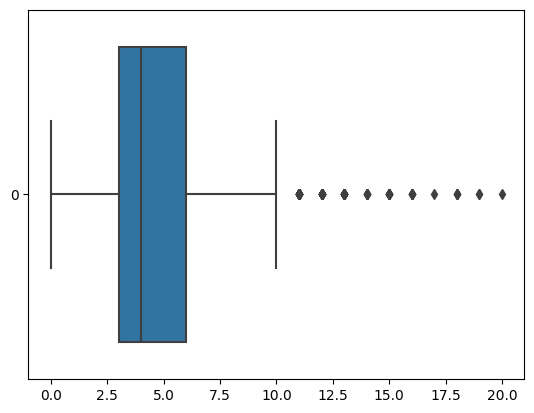

In [209]:
sns.boxplot(data['International calls'], orient='h')

In [210]:
np.median(data['International calls'])

4.0

In [211]:
np.mean(data['International calls'])

4.4338314923110245

In [212]:
data.loc[data['International calls'] > max_limit, 'International calls'] = np.mean(data['International calls'])

<Axes: >

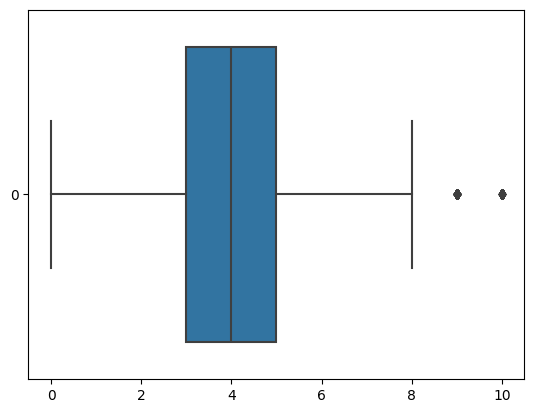

In [213]:
sns.boxplot(data['International calls'], orient='h')

<Axes: xlabel='International calls', ylabel='Density'>

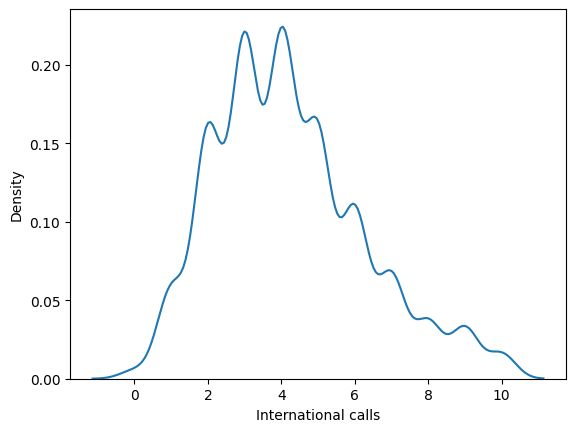

In [214]:
sns.kdeplot(data['International calls'])

## International Charge

In [215]:
IQR = stats.iqr(data['International Charge'], interpolation='midpoint')
IQR

1.0

In [216]:
Q1 = data['International Charge'].quantile(0.25)
 
Q3 =data['International Charge'].quantile(0.75)

min_limit=Q1 - 1.5*IQR

max_limit=Q3 +1.5*IQR

In [217]:
min_limit

0.5

In [218]:
max_limit

4.5

In [219]:
data.loc[data['International Charge'] > max_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
115,21,36,510,1,6.480741,89,33,122,21,126,6,10,6.0,5,0,1
314,13,128,408,0,0.000000,99,21,107,17,111,11,18,2.0,5,0,0
3400,1,132,415,0,0.000000,104,34,101,12,110,6,18,2.0,5,1,0
3568,16,48,408,0,5.099020,60,32,87,15,137,8,18,7.0,5,0,0
3906,16,104,408,0,0.000000,105,32,96,12,123,10,10,4.0,5,1,0
3916,6,68,510,1,0.000000,99,33,106,16,80,11,10,4.0,5,3,1
4396,17,55,415,0,6.082763,89,33,141,19,121,14,10,2.0,5,1,0


In [220]:
data.loc[data['International Charge'] < min_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
44,48,64,510,0,0.000000,67,26,118,19,86,11,3,3.0,0,1,0
179,16,70,408,0,0.000000,122,39,112,24,112,9,10,0.0,0,3,0
225,15,65,415,0,0.000000,111,36,94,19,123,11,2,4.0,0,1,0
343,15,98,408,0,4.582576,98,10,86,14,84,11,10,0.0,0,2,0
397,37,94,415,0,0.000000,103,39,109,23,121,10,2,2.0,0,1,1
488,46,165,510,0,0.000000,126,41,65,17,126,10,10,0.0,0,1,0
543,27,26,415,0,0.000000,109,39,129,18,94,8,3,6.0,0,3,0
567,20,85,510,1,0.000000,73,36,117,16,98,6,3,7.0,0,2,0
595,11,87,408,0,5.291503,95,25,97,12,109,11,10,0.0,0,1,0
706,5,108,415,0,0.000000,78,36,119,16,65,8,3,5.0,0,1,0


In [221]:
len(data.loc[data['International Charge'] > max_limit])

7

In [222]:
len(data.loc[data['International Charge'] < min_limit])

49

<Axes: >

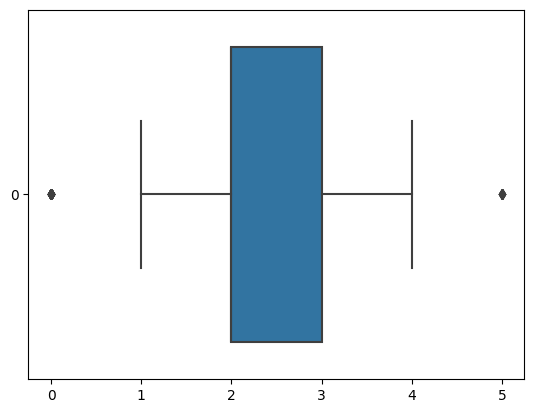

In [223]:
sns.boxplot(data['International Charge'], orient='h')

In [224]:
np.median(data['International Charge'])

2.0

In [225]:
np.mean(data['International Charge'])

2.2969460688758936

In [226]:
data.loc[data['International Charge'] > max_limit, 'International Charge'] = np.mean(data['International Charge'])

In [227]:
data.loc[data['International Charge'] < min_limit, 'International Charge'] = np.mean(data['International Charge'])

In [228]:
data.loc[data['International Charge'] > max_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn


In [229]:
data.loc[data['International Charge'] < min_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn


<Axes: >

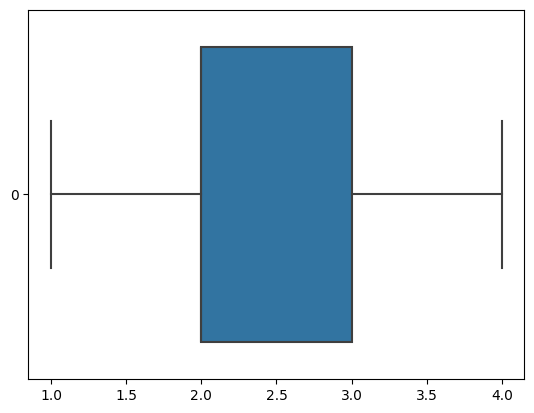

In [230]:
sns.boxplot(data['International Charge'], orient='h')

<Axes: xlabel='International Charge', ylabel='Density'>

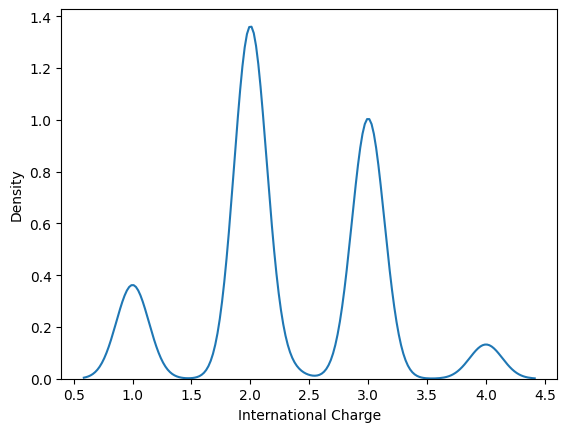

In [231]:
sns.kdeplot(data['International Charge'])

## CustServ Calls

In [232]:
IQR = stats.iqr(data['CustServ Calls'], interpolation='midpoint')
IQR

1.0

In [233]:
Q1 = data['CustServ Calls'].quantile(0.25)
 
Q3 =data['CustServ Calls'].quantile(0.75)

min_limit=Q1 - 1.5*IQR

max_limit=Q3 +1.5*IQR

In [234]:
min_limit

-0.5

In [235]:
max_limit

3.5

In [236]:
data.loc[data['CustServ Calls'] > max_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
10,15,65,415,0,0.000000,137,21,83,19,111,9,12,6.000000,3.0,4,1
14,12,62,415,0,0.000000,70,20,76,26,99,9,13,6.000000,3.0,4,0
15,34,161,415,0,0.000000,67,30,97,17,128,7,5,9.000000,1.0,4,1
21,5,77,408,0,0.000000,89,10,121,14,64,9,5,6.000000,1.0,5,1
48,13,119,415,0,0.000000,114,27,117,19,91,6,8,3.000000,2.0,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4538,14,107,408,0,0.000000,90,38,123,18,79,8,10,4.000000,2.0,4,0
4550,50,69,415,0,0.000000,94,35,124,20,90,11,7,2.000000,1.0,4,0
4562,32,42,415,0,0.000000,100,23,107,19,70,7,14,3.000000,3.0,5,1
4568,31,124,415,0,0.000000,92,18,83,18,100,8,13,4.433831,3.0,4,1


In [237]:
data.loc[data['CustServ Calls'] < min_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn


In [238]:
len(data.loc[data['CustServ Calls'] > max_limit])

368

In [239]:
len(data.loc[data['CustServ Calls'] < min_limit])

0

<Axes: >

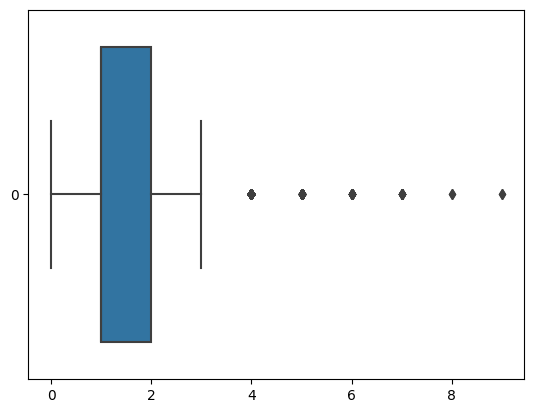

In [240]:
sns.boxplot(data['CustServ Calls'], orient='h')

In [241]:
np.median(data['CustServ Calls'])

1.0

In [242]:
np.mean(data['CustServ Calls'])

1.5670348711284383

In [243]:
data.loc[data['CustServ Calls'] > max_limit, 'CustServ Calls'] = np.mean(data['CustServ Calls'])

In [244]:
data.loc[data['CustServ Calls'] > max_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn


In [245]:
data.loc[data['CustServ Calls'] < min_limit]

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn


<Axes: >

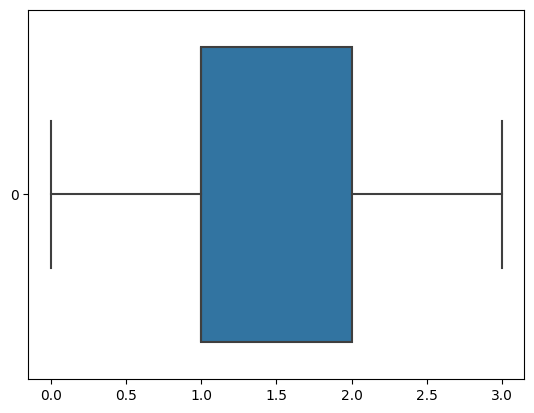

In [246]:
sns.boxplot(data['CustServ Calls'], orient='h')

<Axes: xlabel='CustServ Calls', ylabel='Density'>

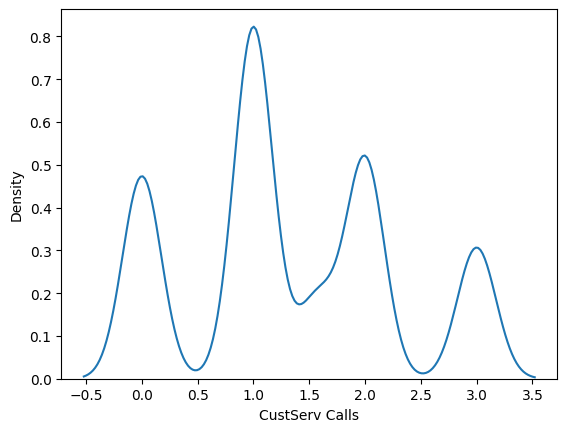

In [247]:
sns.kdeplot(data['CustServ Calls'])

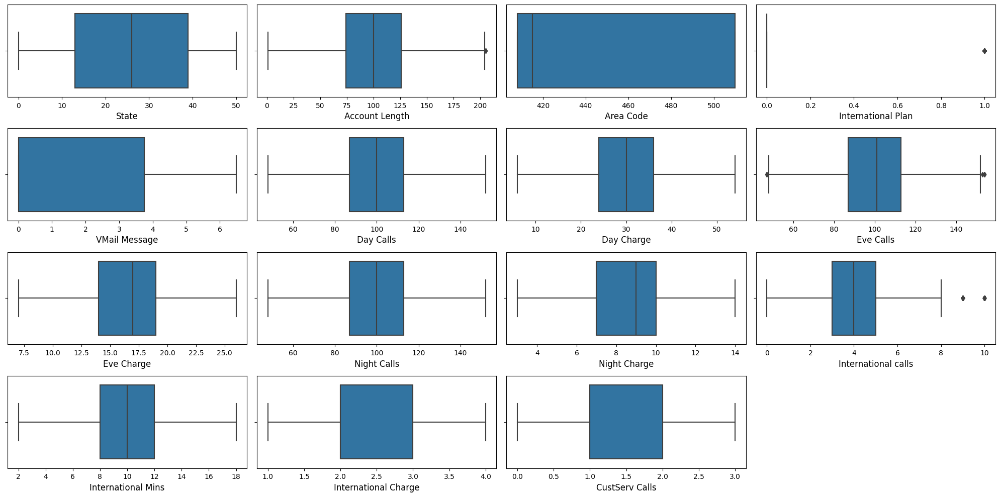

In [248]:
columns_for_boxplot = ['State', 'Account Length', 'Area Code', 'International Plan',
                       'VMail Message', 'Day Calls', 'Day Charge', 'Eve Calls', 'Eve Charge',
                       'Night Calls', 'Night Charge', 'International calls', 'International Mins',
                       'International Charge', 'CustServ Calls']

# Create boxplots for each column
plt.figure(figsize=(20, 10))  # Adjust the figure size as needed
for i, column in enumerate(columns_for_boxplot, 1):
    plt.subplot(4, 4, i)
    sns.boxplot(x=data[column])
    plt.xlabel(column, fontsize=12)

plt.tight_layout()
plt.show()

In [249]:
data.describe()

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
count,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000
mean,26.041585,100.046784,437.046350,0.096600,1.392339,100.197314,30.161577,100.205328,16.560537,99.822612,8.528049,9.881958,4.237908,2.317182,1.329363,0.142084
std,14.790361,38.677504,42.288212,0.295444,2.344736,19.163164,8.883800,19.286444,3.938086,19.098666,2.198580,2.656239,2.058020,0.745630,0.938244,0.349174
min,0.000000,1.000000,408.000000,0.000000,0.000000,48.000000,6.000000,47.000000,7.000000,48.000000,3.000000,2.000000,0.000000,1.000000,0.000000,0.000000
25%,13.000000,74.000000,408.000000,0.000000,0.000000,87.000000,24.000000,87.000000,14.000000,87.000000,7.000000,8.000000,3.000000,2.000000,1.000000,0.000000
50%,26.000000,100.000000,415.000000,0.000000,0.000000,100.000000,30.000000,101.000000,17.000000,100.000000,9.000000,10.000000,4.000000,2.000000,1.000000,0.000000
75%,39.000000,126.000000,510.000000,0.000000,3.741657,113.000000,36.000000,113.000000,19.000000,113.000000,10.000000,12.000000,5.000000,3.000000,2.000000,0.000000
max,50.000000,205.000000,510.000000,1.000000,6.480741,152.000000,54.000000,154.000000,26.000000,152.000000,14.000000,18.000000,10.000000,4.000000,3.000000,1.000000


In [250]:
data.head()

,State,Account Length,Area Code,International Plan,VMail Message,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
0,16,128,415,0,5.00000,110,45,99,16,91,11,10,3.0,2.0,1.0,0
1,35,107,415,0,5.09902,123,27,103,16,103,11,13,3.0,3.0,1.0,0
2,31,137,415,0,0.00000,114,41,110,10,104,7,12,5.0,3.0,0.0,0
3,35,84,408,1,0.00000,71,50,88,17,89,8,6,7.0,1.0,2.0,0
4,36,75,415,1,0.00000,113,28,122,12,121,8,10,3.0,2.0,3.0,0


# Model Creation

In [251]:
X = data.iloc[:, :-1]
y = data.Churn

In [252]:
## creating training and testing data
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X, y,random_state=3)

In [253]:
X_train.shape

(3462, 15)

In [254]:
y_train.shape

(3462,)

In [255]:
data.Churn.value_counts()

Churn
0    3961
1     656
Name: count, dtype: int64

In [256]:
# Install imblearn package - pip install imblearn
from imblearn.over_sampling import SMOTE
smote = SMOTE()

In [257]:
X_smote, y_smote = smote.fit_resample(X_train,y_train)

In [258]:
from collections import Counter
print("Actual Classes",Counter(y_train))
print("SMOTE Classes",Counter(y_smote))

Actual Classes Counter({0: 2958, 1: 504})
SMOTE Classes Counter({1: 2958, 0: 2958})


## Logistic Regression

In [259]:
from sklearn.linear_model import LogisticRegression
LR=LogisticRegression()
LR.fit(X_smote, y_smote)

LogisticRegression()

### training score

In [260]:
LR_y_smote_train_predict=LR.predict(X_smote)
LR_y_smote_train_predict

array([0, 0, 1, ..., 0, 1, 1])

In [261]:
from sklearn.metrics import classification_report
report = classification_report(y_smote,LR_y_smote_train_predict)
print(report)

              precision    recall  f1-score   support

           0       0.62      0.60      0.61      2958
           1       0.61      0.62      0.62      2958

    accuracy                           0.61      5916
   macro avg       0.61      0.61      0.61      5916
weighted avg       0.61      0.61      0.61      5916



### test score

In [262]:
LR_y_smote_test_predict=LR.predict(X_test)
LR_y_smote_test_predict

array([1, 0, 0, ..., 0, 0, 0])

In [263]:
from sklearn.metrics import classification_report
report = classification_report(y_test,LR_y_smote_test_predict)
print(report)

              precision    recall  f1-score   support

           0       0.92      0.59      0.72      1003
           1       0.19      0.65      0.30       152

    accuracy                           0.59      1155
   macro avg       0.55      0.62      0.51      1155
weighted avg       0.82      0.59      0.66      1155



In [264]:
pd.crosstab(y_test,LR_y_smote_test_predict)

col_0,0,1
Churn,,
0,588,415
1,53,99


## Bagging with Logistics Regression

In [265]:
from sklearn.ensemble import BaggingClassifier
model_bagg=BaggingClassifier(base_estimator=LR,n_estimators=400)
model_bagg.fit(X_smote, y_smote)

BaggingClassifier(base_estimator=LogisticRegression(), n_estimators=400)

### training score

In [266]:
y_train_bagg=model_bagg.predict(X_smote)

In [267]:
print(classification_report(y_smote, y_train_bagg))

              precision    recall  f1-score   support

           0       0.61      0.58      0.60      2958
           1       0.60      0.63      0.62      2958

    accuracy                           0.61      5916
   macro avg       0.61      0.61      0.61      5916
weighted avg       0.61      0.61      0.61      5916



### test score

In [268]:
y_test_bagg=model_bagg.predict(X_test)

In [269]:
print(classification_report(y_test, y_test_bagg))

              precision    recall  f1-score   support

           0       0.91      0.56      0.70      1003
           1       0.18      0.64      0.28       152

    accuracy                           0.57      1155
   macro avg       0.55      0.60      0.49      1155
weighted avg       0.82      0.57      0.64      1155



## Logistic regression
* Training score - 61%
* test score - 59%

## Logistic regression with Bagging
* training score - 61%
* test score - 57%

---------------------------

# K-Nearest Neighbour

In [271]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors = 5, metric = 'minkowski', p = 2)
knn.fit(X_smote, y_smote)

KNeighborsClassifier()

### training score

In [272]:
knn_y_smote_train_predict=knn.predict(X_smote)
knn_y_smote_train_predict

array([1, 1, 1, ..., 1, 1, 1])

In [273]:
from sklearn.metrics import classification_report
report = classification_report(y_smote,knn_y_smote_train_predict)
print(report)

              precision    recall  f1-score   support

           0       0.99      0.73      0.84      2958
           1       0.79      1.00      0.88      2958

    accuracy                           0.86      5916
   macro avg       0.89      0.86      0.86      5916
weighted avg       0.89      0.86      0.86      5916



### test score

In [274]:
knn_y_smote_test_predict=knn.predict(X_test)

In [275]:
from sklearn.metrics import classification_report
report = classification_report(y_test,knn_y_smote_test_predict)
print(report)

              precision    recall  f1-score   support

           0       0.97      0.71      0.82       799
           1       0.31      0.84      0.45       125

    accuracy                           0.73       924
   macro avg       0.64      0.77      0.63       924
weighted avg       0.88      0.73      0.77       924



In [276]:
pd.crosstab(y_test,knn_y_smote_test_predict)

col_0,0,1
Churn,,
0,565,234
1,20,105


## Bagging with K-Nearest neighbour

In [277]:
from sklearn.ensemble import BaggingClassifier
model_bagg=BaggingClassifier(base_estimator=knn,n_estimators=400)
model_bagg.fit(X_smote, y_smote)

BaggingClassifier(base_estimator=KNeighborsClassifier(), n_estimators=400)

### training score

In [278]:
y_train_bagg=model_bagg.predict(X_smote)

In [279]:
print(classification_report(y_smote, y_train_bagg))

              precision    recall  f1-score   support

           0       0.99      0.74      0.85      2958
           1       0.79      1.00      0.88      2958

    accuracy                           0.87      5916
   macro avg       0.89      0.87      0.86      5916
weighted avg       0.89      0.87      0.86      5916



### test score

In [280]:
y_test_bagg=model_bagg.predict(X_test)

In [281]:
print(classification_report(y_test, y_test_bagg))

              precision    recall  f1-score   support

           0       0.97      0.71      0.82       799
           1       0.31      0.84      0.45       125

    accuracy                           0.73       924
   macro avg       0.64      0.77      0.64       924
weighted avg       0.88      0.73      0.77       924



## K_Nearest neighbour 
* training score - 86%
* test score - 73%

## K_Nearest neighbour
* training score - 87%
* test score - 73%

---------------

# Support Vector machine

In [282]:
from sklearn.svm import SVC
svm = SVC(kernel = 'linear', random_state = 0)
svm.fit(X_smote, y_smote)

SVC(kernel='linear', random_state=0)

### training score

In [283]:
svm_y_smote_train_predict=svm.predict(X_smote)

In [284]:
from sklearn.metrics import classification_report
report = classification_report(y_smote,svm_y_smote_train_predict)
print(report)

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      2958
           1       0.68      0.47      0.56      2958

    accuracy                           0.63      5916
   macro avg       0.64      0.63      0.62      5916
weighted avg       0.64      0.63      0.62      5916



### testing score

In [285]:
svm_y_smote_test_predict=svm.predict(X_test)

In [286]:
from sklearn.metrics import classification_report
report = classification_report(y_test,svm_y_smote_test_predict)
print(report)

              precision    recall  f1-score   support

           0       0.90      0.74      0.82       799
           1       0.23      0.49      0.31       125

    accuracy                           0.71       924
   macro avg       0.57      0.62      0.56       924
weighted avg       0.81      0.71      0.75       924



In [287]:
pd.crosstab(y_test,svm_y_smote_test_predict)

col_0,0,1
Churn,,
0,595,204
1,64,61


## SVM
* training score - 63%
* test score - 71%

-----------------

## Decision Tree

In [288]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier(criterion = 'entropy', random_state = 0)
dt.fit(X_smote, y_smote)

DecisionTreeClassifier(criterion='entropy', random_state=0)

### training score

In [289]:
dt_y_smote_train_predict=dt.predict(X_smote)

In [290]:
from sklearn.metrics import classification_report
report = classification_report(y_smote,dt_y_smote_train_predict)
print(report)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2958
           1       1.00      1.00      1.00      2958

    accuracy                           1.00      5916
   macro avg       1.00      1.00      1.00      5916
weighted avg       1.00      1.00      1.00      5916



### testing score

In [291]:
dt_y_smote_test_predict=dt.predict(X_test)

In [292]:
from sklearn.metrics import classification_report
report = classification_report(y_test,dt_y_smote_test_predict)
print(report)

              precision    recall  f1-score   support

           0       0.99      0.97      0.98       799
           1       0.84      0.91      0.88       125

    accuracy                           0.97       924
   macro avg       0.92      0.94      0.93       924
weighted avg       0.97      0.97      0.97       924



In [293]:
pd.crosstab(y_test,dt_y_smote_test_predict)

col_0,0,1
Churn,,
0,778,21
1,11,114


## Decision Tree
* training score - 100%
* test score - 97%

-------------------------------

## Naive Bayes

In [294]:
from sklearn.naive_bayes import GaussianNB
nb = GaussianNB()
nb.fit(X_smote, y_smote)

GaussianNB()

### Training score

In [295]:
nb_y_smote_train_predict=nb.predict(X_smote)

In [296]:
from sklearn.metrics import classification_report
report = classification_report(y_smote,nb_y_smote_train_predict)
print(report)

              precision    recall  f1-score   support

           0       0.71      0.66      0.68      2958
           1       0.68      0.74      0.71      2958

    accuracy                           0.70      5916
   macro avg       0.70      0.70      0.70      5916
weighted avg       0.70      0.70      0.70      5916



### test score

In [297]:
nb_y_smote_test_predict=nb.predict(X_test)

In [298]:
from sklearn.metrics import classification_report
report = classification_report(y_test,nb_y_smote_test_predict)
print(report)

              precision    recall  f1-score   support

           0       0.92      0.64      0.75       799
           1       0.22      0.64      0.32       125

    accuracy                           0.64       924
   macro avg       0.57      0.64      0.54       924
weighted avg       0.82      0.64      0.69       924



In [299]:
pd.crosstab(y_test,nb_y_smote_test_predict)

col_0,0,1
Churn,,
0,509,290
1,45,80


## Naive bayes
* training score - 70%
* test score - 64%

--------------------------------------

## Random Forest

In [300]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state = 0)
rf.fit(X_smote, y_smote)

RandomForestClassifier(criterion='entropy', n_estimators=10, random_state=0)

### training score

In [301]:
rf_y_smote_train_predict=rf.predict(X_smote)

In [302]:
from sklearn.metrics import classification_report
report = classification_report(y_smote,rf_y_smote_train_predict)
print(report)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2958
           1       1.00      1.00      1.00      2958

    accuracy                           1.00      5916
   macro avg       1.00      1.00      1.00      5916
weighted avg       1.00      1.00      1.00      5916



### testing score

In [303]:
rf_y_smote_test_predict=rf.predict(X_test)

In [304]:
from sklearn.metrics import classification_report
report = classification_report(y_test,rf_y_smote_test_predict)
print(report)

              precision    recall  f1-score   support

           0       0.98      0.99      0.98       799
           1       0.94      0.86      0.90       125

    accuracy                           0.97       924
   macro avg       0.96      0.92      0.94       924
weighted avg       0.97      0.97      0.97       924



In [305]:
pd.crosstab(y_test,rf_y_smote_test_predict)

col_0,0,1
Churn,,
0,792,7
1,18,107


## Random Forest
* training score - 100%
* test score - 97%

------------------------------

## Gradient Boosting

### training score

In [306]:
## importing the model library
from sklearn.ensemble import GradientBoostingClassifier
gbm=GradientBoostingClassifier() ## object creation
gbm.fit(X_smote, y_smote) ## fitting the data
y_gbm=gbm.predict(X_smote)#predicting the price

In [307]:
## evaluating the model
from sklearn.metrics import classification_report# to check model performance
print(classification_report(y_smote,y_gbm))

              precision    recall  f1-score   support

           0       0.93      0.96      0.94      2958
           1       0.96      0.93      0.94      2958

    accuracy                           0.94      5916
   macro avg       0.94      0.94      0.94      5916
weighted avg       0.94      0.94      0.94      5916



### test score

In [308]:
y_gbm_test=gbm.predict(X_test)

In [309]:
## evaluating the model
from sklearn.metrics import classification_report# to check model performance
print(classification_report(y_test,y_gbm_test))

              precision    recall  f1-score   support

           0       0.96      0.96      0.96       799
           1       0.73      0.71      0.72       125

    accuracy                           0.93       924
   macro avg       0.84      0.84      0.84       924
weighted avg       0.92      0.93      0.92       924



In [310]:
pd.crosstab(y_test,y_gbm_test)

col_0,0,1
Churn,,
0,766,33
1,36,89


## Gradient Boosting
* training score - 94%
* test score - 93%

-----------------------------------

## XG Boost

### training score

In [311]:
import xgboost 
## model creation
from xgboost import XGBClassifier#importing the model library
xgb_r=XGBClassifier() ## object creation
xgb_r.fit(X_smote, y_smote)# fitting the data
y_hat=xgb_r.predict(X_smote)

In [312]:
print(classification_report(y_smote,y_hat))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2958
           1       1.00      1.00      1.00      2958

    accuracy                           1.00      5916
   macro avg       1.00      1.00      1.00      5916
weighted avg       1.00      1.00      1.00      5916



### test score

In [313]:
y_hat_test=xgb_r.predict(X_test)

In [314]:
print(classification_report(y_test,y_hat_test))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       799
           1       0.95      0.94      0.94       125

    accuracy                           0.98       924
   macro avg       0.97      0.96      0.97       924
weighted avg       0.98      0.98      0.98       924



In [315]:
pd.crosstab(y_test,y_hat_test)

col_0,0,1
Churn,,
0,793,6
1,8,117


## XG Boost
* training score - 100%
* test score - 98%

## Conclusion:
                    ** From the all above prediction and the analysis,Gradient Boosting is predicting the model well.Through these algorthim we have achieved the high accuracy.